<a href="https://colab.research.google.com/github/andrix17/proWine/blob/main/notebook/ProWineWithSelection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **ProWine Project with Selection** 
Script R per analisi dei vitigni dei vini usando un dataset di recensioni preso da Kaggle https://www.kaggle.com/zynicide/wine-reviews selezionando solo i vitigni che si vogliono analizzare.

## **Installazione librerie e download dei dati necessari**

In [ ]:
install.packages("lsa")
install.packages("tm")
install.packages("RWeka")
install.packages("stopwords")
library(tm)
library(lsa)
library(RWeka)
library(stopwords)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependency ‘SnowballC’


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘NLP’, ‘slam’


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘RWekajars’, ‘rJava’


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependency ‘ISOcodes’


Loading required package: NLP

Loading required package: SnowballC


Attaching package: ‘stopwords’


The following object is masked from ‘package:tm’:

    stopwords




In [ ]:
#Aggiornare link da github
download.file('https://raw.githubusercontent.com/andrix17/proWine/main/dataset/winemag-data-130k-v2.csv?token=AMASMT7SXBAZQZZRDBJC3JTAWZIYW','wineData.csv')

In [ ]:
wineData <- read.csv('wineData.csv')

## **Preparazione dati**

In [ ]:
head(wineData)

,X,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
,<int>,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,0,Italy,"Aromas include tropical fruit, broom, brimstone and dried herb. The palate isn't overly expressive, offering unripened apple, citrus and dried sage alongside brisk acidity.",Vulkà Bianco,87,NA,Sicily & Sardinia,Etna,,Kerin O’Keefe,@kerinokeefe,Nicosia 2013 Vulkà Bianco (Etna),White Blend,Nicosia
2,1,Portugal,"This is ripe and fruity, a wine that is smooth while still structured. Firm tannins are filled out with juicy red berry fruits and freshened with acidity. It's already drinkable, although it will certainly be better from 2016.",Avidagos,87,15,Douro,,,Roger Voss,@vossroger,Quinta dos Avidagos 2011 Avidagos Red (Douro),Portuguese Red,Quinta dos Avidagos
3,2,US,"Tart and snappy, the flavors of lime flesh and rind dominate. Some green pineapple pokes through, with crisp acidity underscoring the flavors. The wine was all stainless-steel fermented.",,87,14,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm
4,3,US,"Pineapple rind, lemon pith and orange blossom start off the aromas. The palate is a bit more opulent, with notes of honey-drizzled guava and mango giving way to a slightly astringent, semidry finish.",Reserve Late Harvest,87,13,Michigan,Lake Michigan Shore,,Alexander Peartree,,St. Julian 2013 Reserve Late Harvest Riesling (Lake Michigan Shore),Riesling,St. Julian
5,4,US,"Much like the regular bottling from 2012, this comes across as rather rough and tannic, with rustic, earthy, herbal characteristics. Nonetheless, if you think of it as a pleasantly unfussy country wine, it's a good companion to a hearty winter stew.",Vintner's Reserve Wild Child Block,87,65,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Sweet Cheeks 2012 Vintner's Reserve Wild Child Block Pinot Noir (Willamette Valley),Pinot Noir,Sweet Cheeks
6,5,Spain,"Blackberry and raspberry aromas show a typical Navarran whiff of green herbs and, in this case, horseradish. In the mouth, this is fairly full bodied, with tomatoey acidity. Spicy, herbal flavors complement dark plum fruit, while the finish is fresh but grabby.",Ars In Vitro,87,15,Northern Spain,Navarra,,Michael Schachner,@wineschach,Tandem 2011 Ars In Vitro Tempranillo-Merlot (Navarra),Tempranillo-Merlot,Tandem


In [ ]:
nrow(wineData)

[1] 129971

### **Eliminazione duplicati**

In [ ]:
wineData <- wineData[!duplicated(wineData$description), ]

In [ ]:
nrow(wineData)

[1] 119955

### **Trasformazione Shiraz in Syrah**

In [ ]:
variety = wineData$variety
variety[variety=="Shiraz"]= "Syrah"
wines = wineData$winery
reviews = wineData$description
head(sort(table(variety), decreasing = T),20)

variety
              Pinot Noir               Chardonnay       Cabernet Sauvignon 
                   12277                    10867                     8837 
               Red Blend Bordeaux-style Red Blend                 Riesling 
                    8239                     6469                     4773 
                   Syrah          Sauvignon Blanc                     Rosé 
                    4616                     4574                     3220 
                  Merlot                 Nebbiolo                Zinfandel 
                    2895                     2602                     2530 
              Sangiovese                   Malbec           Portuguese Red 
                    2460                     2446                     2282 
             White Blend          Sparkling Blend              Tempranillo 
                    2179                     1971                     1671 
   Rhône-style Red Blend               Pinot Gris 
                    1343     

### **Selezione dei vitigni che si vogliono analizzare**

In [ ]:
selection = variety=="Pinot Noir" | 
            variety=="Chardonnay" | 
            variety=="Cabernet Sauvignon" | 
            variety=="Riesling" | 
            variety=="Sauvignon Blanc" | 
            variety=="Syrah" | 
            variety=="Merlot" | 
            variety=="Nebbiolo" 
variety = variety[selection]
reviews = reviews[selection]

In [ ]:
length(reviews)

[1] 51441

In [ ]:
corpus <- Corpus(VectorSource(reviews))
inspect(corpus[1:5])

<<SimpleCorpus>>
Metadata:  corpus specific: 1, document level (indexed): 0
Content:  documents: 5

[1] Pineapple rind, lemon pith and orange blossom start off the aromas. The palate is a bit more opulent, with notes of honey-drizzled guava and mango giving way to a slightly astringent, semidry finish.                                                                                                             
[2] Much like the regular bottling from 2012, this comes across as rather rough and tannic, with rustic, earthy, herbal characteristics. Nonetheless, if you think of it as a pleasantly unfussy country wine, it's a good companion to a hearty winter stew.                                                           
[3] Soft, supple plum envelopes an oaky structure in this Cabernet, supported by 15% Merlot. Coffee and chocolate complete the picture, finishing strong at the end, resulting in a value-priced wine of attractive flavor and immediate accessibility.                           

### **Trasformazione in lowercase**

In [ ]:
corpus <- tm_map(corpus, tolower)
inspect(corpus[1:5])

Warning message in tm_map.SimpleCorpus(corpus, tolower):
“transformation drops documents”


<<SimpleCorpus>>
Metadata:  corpus specific: 1, document level (indexed): 0
Content:  documents: 5

[1] pineapple rind, lemon pith and orange blossom start off the aromas. the palate is a bit more opulent, with notes of honey-drizzled guava and mango giving way to a slightly astringent, semidry finish.                                                                                                             
[2] much like the regular bottling from 2012, this comes across as rather rough and tannic, with rustic, earthy, herbal characteristics. nonetheless, if you think of it as a pleasantly unfussy country wine, it's a good companion to a hearty winter stew.                                                           
[3] soft, supple plum envelopes an oaky structure in this cabernet, supported by 15% merlot. coffee and chocolate complete the picture, finishing strong at the end, resulting in a value-priced wine of attractive flavor and immediate accessibility.                           

### **Eliminazione stopword**


In [ ]:
stopwordlist <- stopwords::stopwords("en", source= "stopwords-iso")#Snowball, marimo, nltk, stopwords-iso, smart
length(stopwordlist)

[1] 1298

In [ ]:
stopwordlist <- stopwords::stopwords("en", source= "stopwords-iso")#Snowball, marimo, nltk, stopwords-iso, smart
corpus <- tm_map(corpus, removeWords, stopwordlist)
inspect(corpus[1:5])

Warning message in tm_map.SimpleCorpus(corpus, removeWords, stopwordlist):
“transformation drops documents”


<<SimpleCorpus>>
Metadata:  corpus specific: 1, document level (indexed): 0
Content:  documents: 5

[1] pineapple rind, lemon pith  orange blossom start   aromas.  palate   bit  opulent,  notes  honey-drizzled guava  mango      astringent, semidry finish.                                                                                                 
[2]    regular bottling  2012,      rough  tannic,  rustic, earthy, herbal characteristics. ,        pleasantly unfussy country wine,    companion   hearty winter stew.                                                                                    
[3] soft, supple plum envelopes  oaky structure   cabernet, supported  15% merlot. coffee  chocolate complete  picture, finishing strong   ,    -priced wine  attractive flavor   accessibility.                                                            
[4]  reduced,  wine offers  chalky, tannic backbone    juicy explosion  rich black cherry,   accented   firm oak  cigar box.                 

### **Eliminazione punteggiatura**

In [ ]:
corpus <- tm_map(corpus, removePunctuation)
inspect(corpus[1:5])

Warning message in tm_map.SimpleCorpus(corpus, removePunctuation):
“transformation drops documents”


<<SimpleCorpus>>
Metadata:  corpus specific: 1, document level (indexed): 0
Content:  documents: 5

[1] pineapple rind lemon pith  orange blossom start   aromas  palate   bit  opulent  notes  honeydrizzled guava  mango      astringent semidry finish                                                                                                  
[2]    regular bottling  2012      rough  tannic  rustic earthy herbal characteristics         pleasantly unfussy country wine    companion   hearty winter stew                                                                                       
[3] soft supple plum envelopes  oaky structure   cabernet supported  15 merlot coffee  chocolate complete  picture finishing strong       priced wine  attractive flavor   accessibility                                                               
[4]  reduced  wine offers  chalky tannic backbone    juicy explosion  rich black cherry   accented   firm oak  cigar box                                    

### **Eliminazione termini troppo sparsi**

In [ ]:
tdmc <- TermDocumentMatrix(corpus)
tdmc

<<TermDocumentMatrix (terms: 25866, documents: 51441)>>
Non-/sparse entries: 1097510/1329475396
Sparsity           : 100%
Maximal term length: 29
Weighting          : term frequency (tf)

In [ ]:
tdmTemp <- removeSparseTerms(tdmc, 0.995)
tdmTemp

<<TermDocumentMatrix (terms: 668, documents: 51441)>>
Non-/sparse entries: 812116/33550472
Sparsity           : 98%
Maximal term length: 15
Weighting          : term frequency (tf)

### **Applicazione del Term Weighting**

In [ ]:
tdm <-as.matrix(tdmTemp)
tdmPesata <-lw_logtf(tdm) * ( 1 - entropy( tdm ) )

## **Applicazione di LSA**

### **Creazione spazio LSA**

In [ ]:
words <- rownames(tdmTemp)
head(words)

[1] "aromas"     "astringent" "bit"        "blossom"    "finish"    
[6] "lemon"

In [ ]:
lsar <- lsa(tdmPesata)

In [ ]:
length(lsar$sk)

[1] 264

### **Grafico degli autovalori determinati in LSA**

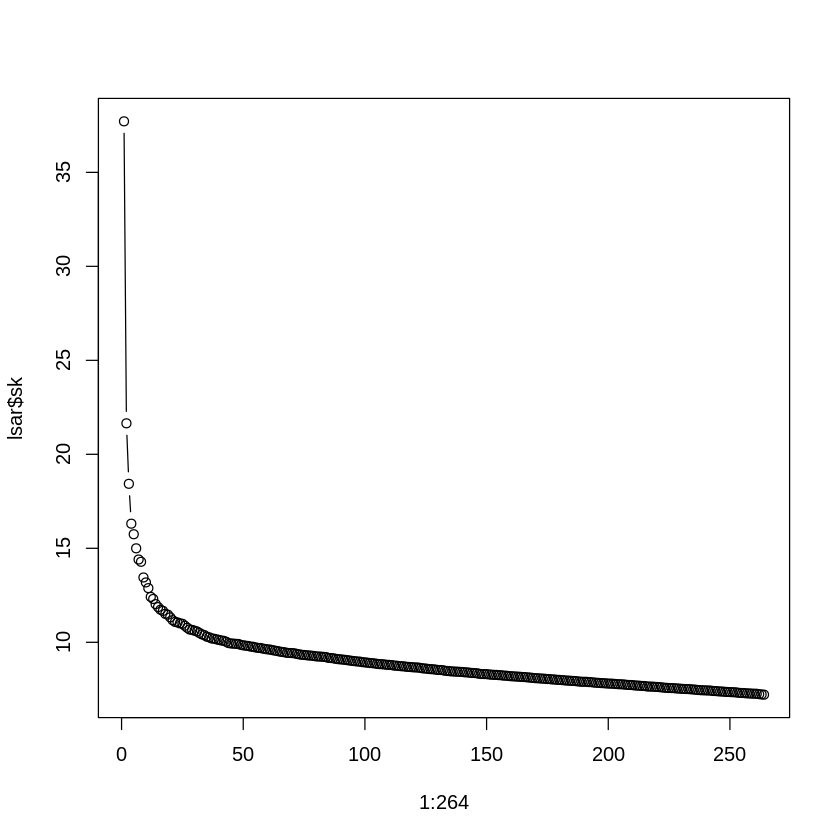

In [ ]:
plot(1:264, lsar$sk, type="b")

### **Grafici dei termini nello spazio latente**

In [ ]:
tls <- lsar$tk %*% diag(lsar$sk)
dls <- lsar$dk %*% diag(lsar$sk)

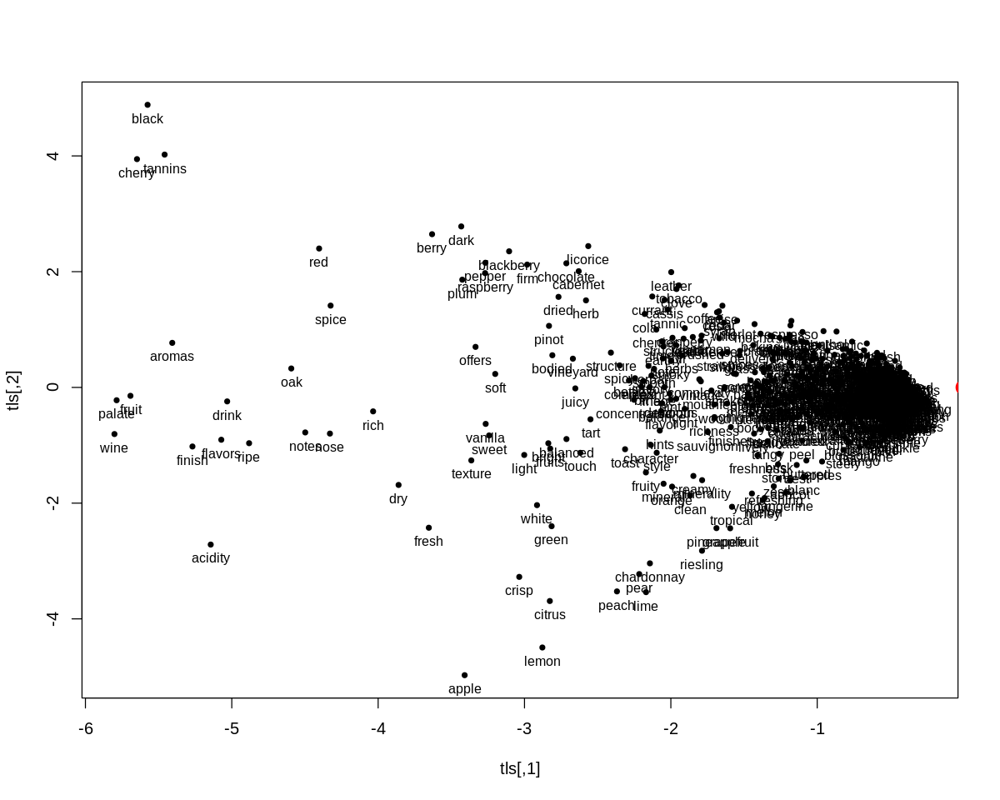

In [ ]:
options(repr.plot.width=10, repr.plot.height=8)
plot(tls, pch=20)
text(tls,labels=words, cex=0.8, pos=1)
points(0,0,pch=20,cex=3,col="red")

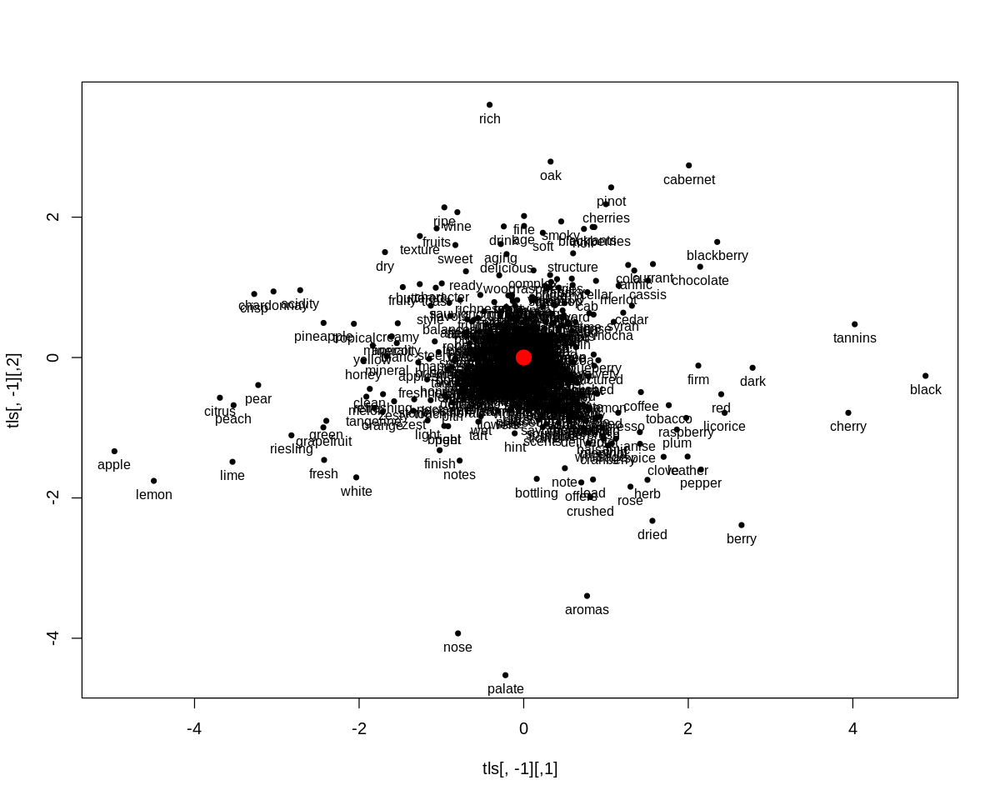

In [ ]:
plot(tls[,-1], pch=20)
text(tls[,-1],labels=words, cex=0.8, pos=1)
points(0,0,pch=20,cex=3,col="red")

In [ ]:
norm_vec <- function(x) sqrt(sum(x^2))
norma_termini_lsa <- apply(tls, 1, norm_vec)

In [ ]:
nrow(tls)

[1] 668

In [ ]:
tls_ridotto <- subset(tls, norma_termini_lsa > 5)
words_ridotto <- subset(words, norma_termini_lsa > 5)

In [ ]:
nrow(tls_ridotto)

[1] 297

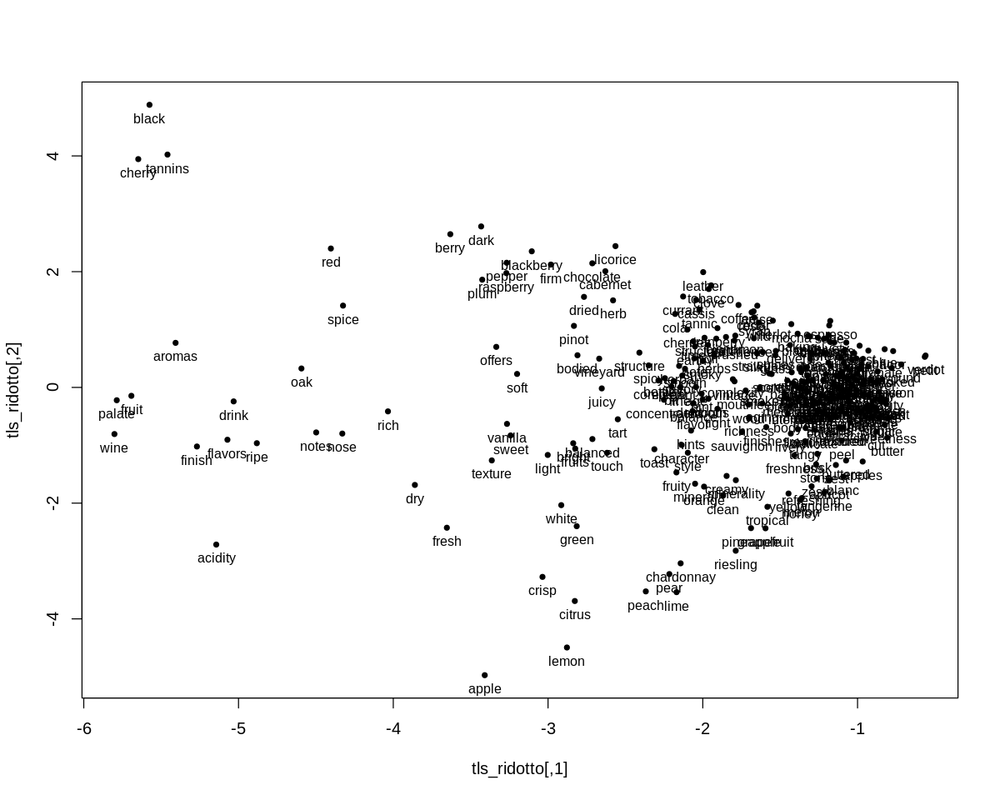

In [ ]:
plot(tls_ridotto, pch=20)
text(tls_ridotto,labels=words_ridotto, cex=0.8, pos=1)
points(0,0,pch=20,cex=3,col="red")

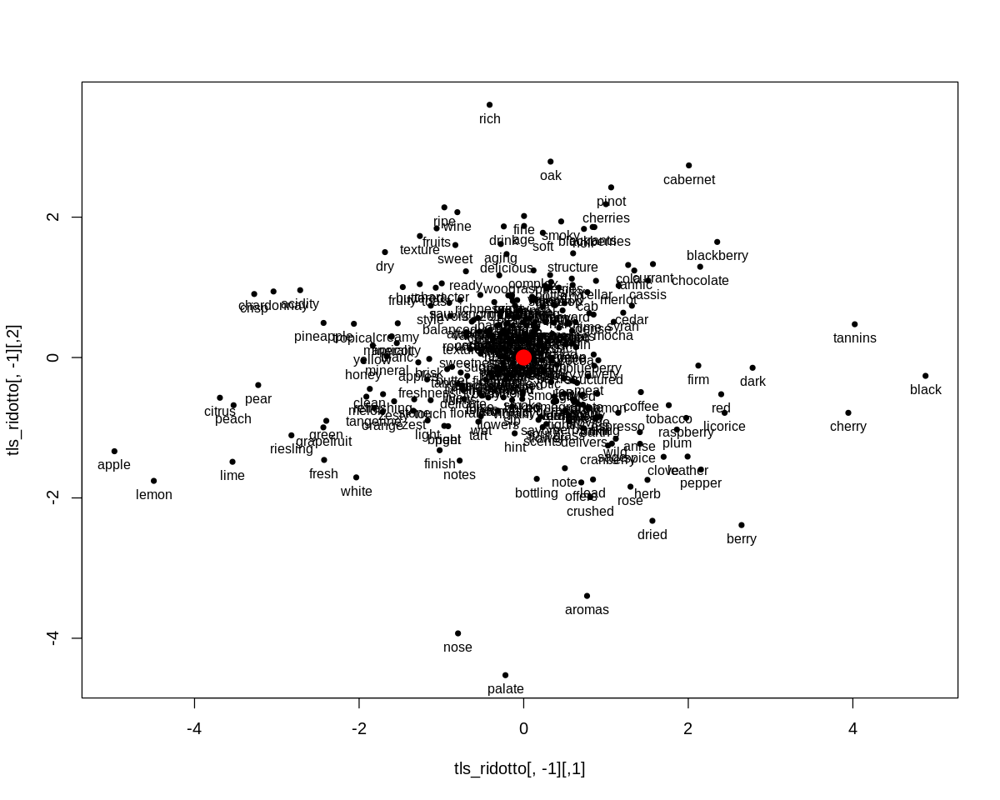

In [ ]:
plot(tls_ridotto[,-1], pch=20)
text(tls_ridotto[,-1],labels=words_ridotto, cex=0.8, pos=1)
points(0,0,pch=20,cex=3,col="red")

### **Grafici dei review nello spazio latente**

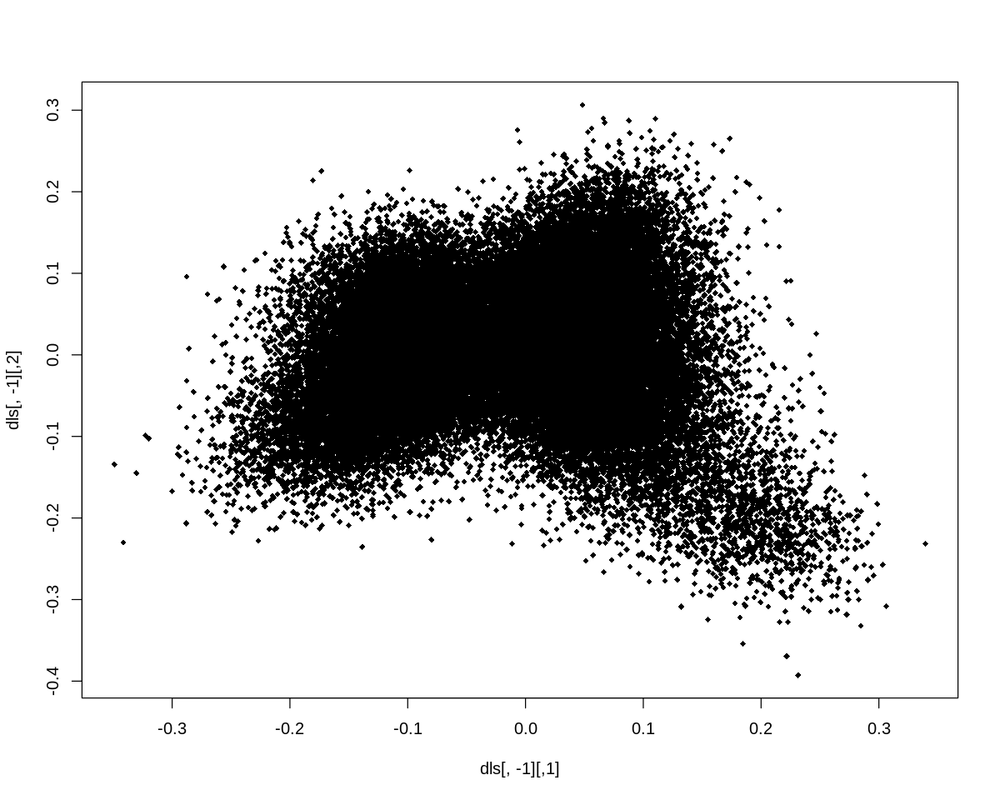

In [ ]:
plot( dls[,-1], pch=18, cex=0.8 )

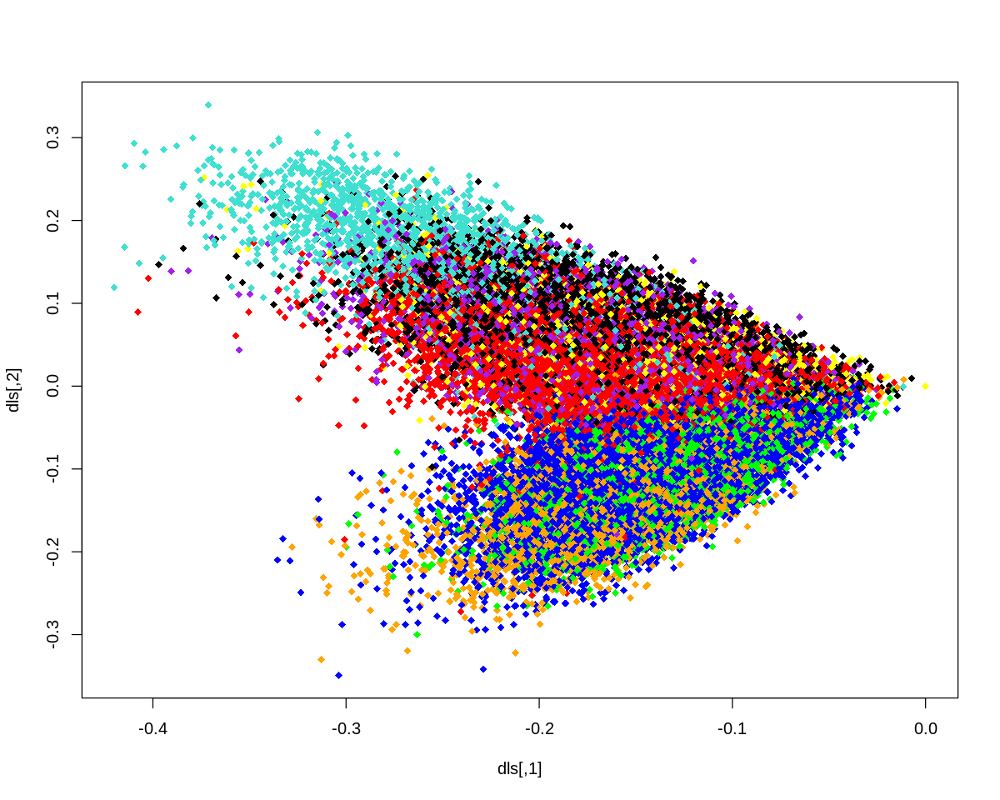

In [ ]:
varietycolor <- function(x) switch(x, "Pinot Noir" = "red",
                                      "Chardonnay"="blue", 
                                      "Cabernet Sauvignon"="black", 
                                      "Syrah"="purple", 
                                      "Riesling" = "orange",
                                      "Sauvignon Blanc"="green",
                                      "Nebbiolo"="turquoise",
                                      "Merlot"="yellow",
                                      "grey")
damcols <- sapply(variety, varietycolor)
plot( dls, pch=18, cex=1, col=damcols )

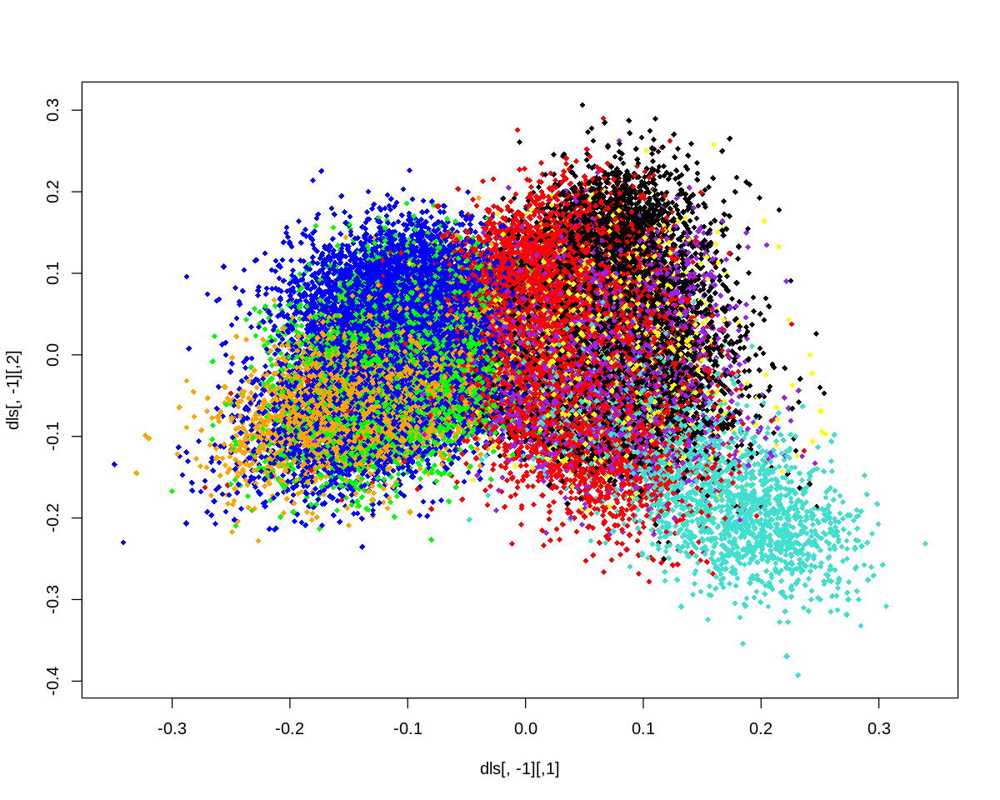

In [ ]:
plot( dls[,-1], pch=18, cex=0.8, col=damcols )

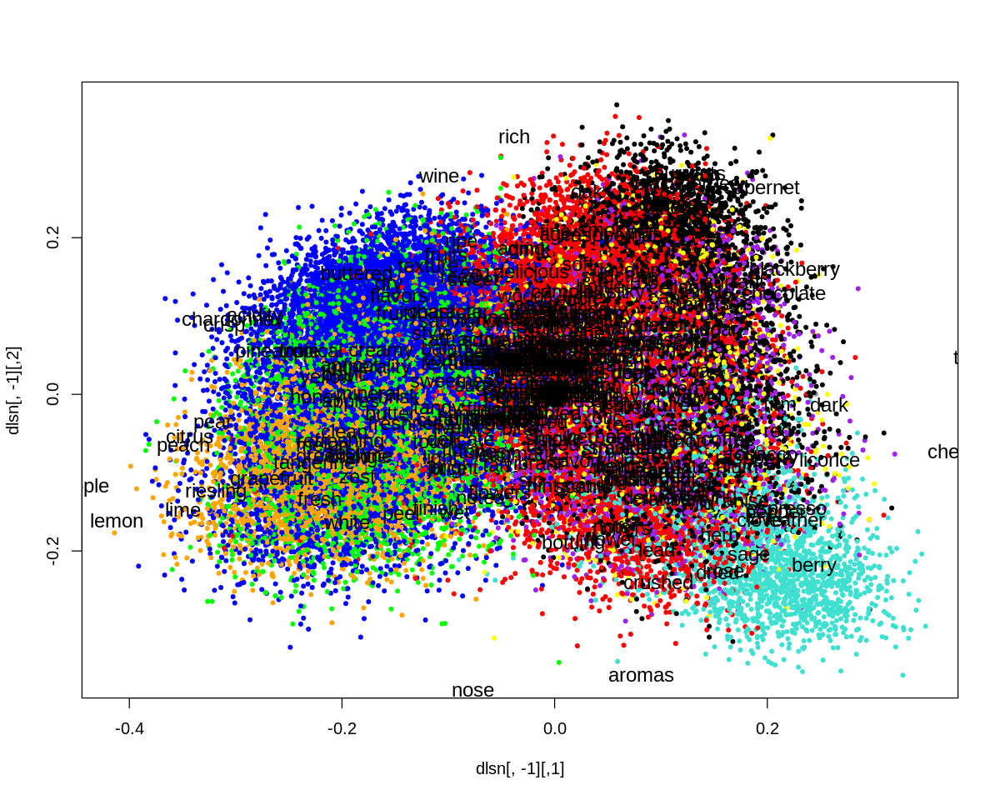

In [ ]:
normrows <- function(x) x / apply(x,1,norm,"2")
tlsn_ridotto <- normrows(tls_ridotto)
tlsn <- normrows(tls)
dlsn <- normrows(dls)
plot( dlsn[,-1], pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto[,-1], labels=words_ridotto, cex=1.2 )
points( 0, 0, pch=20, cex=5 )

## **Analisi per vitigno** 

### **Analisi Nebbiolo**

In [ ]:
sage.vs.Nebbiolo <- table( tdm["sage",]>0, variety=="Nebbiolo")
dimnames(sage.vs.Nebbiolo) <- list(sage = c("No", "Si"), Nebbiolo = c("No", "Si"))
chisqtest = chisq.test( sage.vs.Nebbiolo, correct=FALSE )
chisqtest


	Pearson's Chi-squared test

data:  sage.vs.Nebbiolo
X-squared = 1930.8, df = 1, p-value < 2.2e-16


In [ ]:
chisqtest$expected
chisqtest$observed

,No,Si
No,48095.6059,2562.39412
Si,743.3941,39.60588


    Nebbiolo
sage    No    Si
  No 48363  2295
  Si   476   307

In [ ]:
neighborSage = names (associate(tls[,2:3], "sage", threshold=0.999))

In [ ]:
norma_termini_lsa[neighborSage]

balsamic        herb        grip      emerge     menthol  underbrush 
   3.203140    9.711971    2.418638    1.587522    3.127923    2.453809 
   nebbiolo      center      grippy   cranberry      violet      smoked 
   2.828281    1.383184    1.565293    9.204670    4.222664    5.210817 
pomegranate 
   5.454905

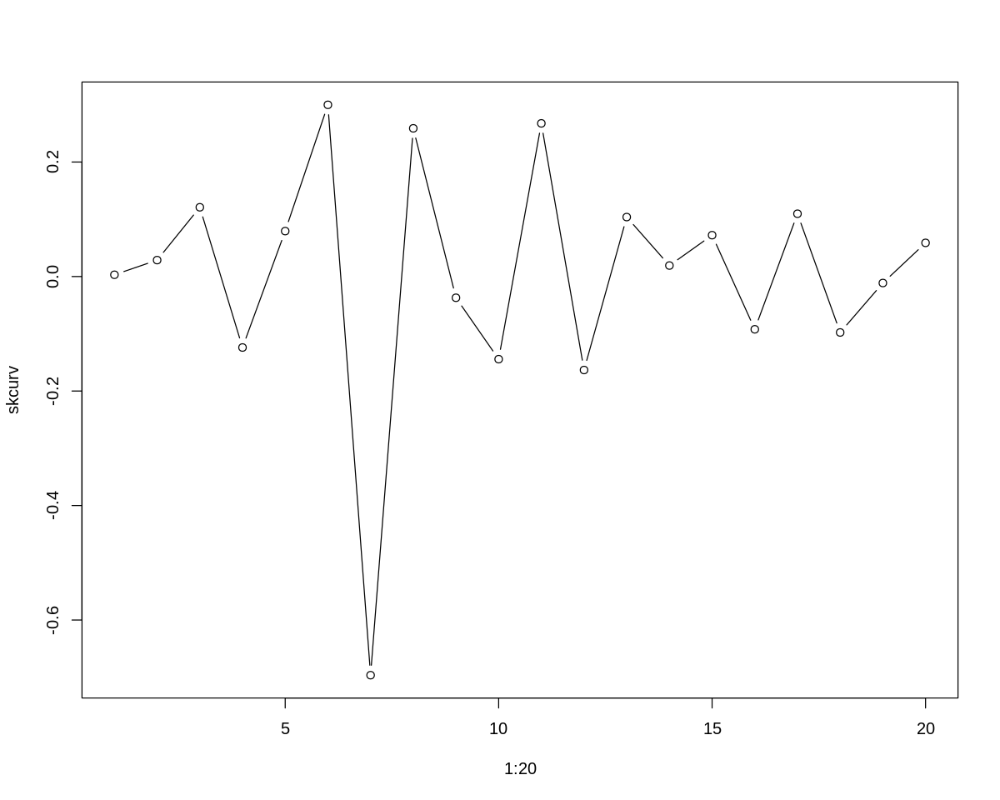

In [ ]:
fordiff <- function(x) x[2:length(x)] - x[1:(length(x)-1)]
skd <- fordiff(lsar$sk)
skdd <- fordiff(skd)
skcurv <- skdd[1:20] / (1+(skd[1:20])^2)^1.5
plot( 1:20, skcurv, type="b" )

In [ ]:
makequery <- function(Q, TDM, LSA) {
  V <- query( Q, rownames(TDM) )
  W <- lw_logtf(V) * (1-entropy(TDM))
  LS <- t(W) %*% LSA$tk
  DK <- LS %*% diag(LSA$sk^-1)
  DKSRS <- DK %*% diag(sqrt(LSA$sk))
  list( query=Q, bin=V, v=W, dk=DK, ls=LS, dksrs=DKSRS )
}

In [ ]:
cosines <- function(X, Q) apply( X, 1, cosine, as.vector(Q) )
top <- function(X, N) order( X, decreasing=TRUE )[1:N]
tnorms4 <- apply( tls[,1:7], 1, norm, "2" )
tksrs <- lsar$tk %*% diag( sqrt( lsar$sk ) )

In [ ]:
NebbioloQuery <- makequery( "balsamic sage", tdm, lsar )
variety[top(cosines(dls[,1:7],NebbioloQuery$ls[1:7]),10)]
#reviews[top(cosines(dls[,1:7],NebbioloQuery$ls[1:7]),10)]
head(sort(table( variety[ top( cosines( dls[,1:7], NebbioloQuery$ls[1:7] ), 2602 ) ] ), decreasing = T))

[1] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"
 [7] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"


          Nebbiolo Cabernet Sauvignon         Pinot Noir              Syrah 
              1949                215                184                160 
            Merlot         Chardonnay 
                84                  4 

In [ ]:
table(variety[top(cosines(dls[,1:7],NebbioloQuery$ls[1:7]),10)])["Nebbiolo"]/10

Nebbiolo 
       1

In [ ]:
table(variety[top(cosines(dls[,1:7],NebbioloQuery$ls[1:7]),50)])["Nebbiolo"]/50

Nebbiolo 
       1

In [ ]:
table(variety[top(cosines(dls[,1:7],NebbioloQuery$ls[1:7]),100)])["Nebbiolo"]/100

Nebbiolo 
       1

In [ ]:
table(variety[top(cosines(dls[,1:7],NebbioloQuery$ls[1:7]),500)])["Nebbiolo"]/500

Nebbiolo 
       1

In [ ]:
table(variety[top(cosines(dls[,1:7],NebbioloQuery$ls[1:7]),1000)])["Nebbiolo"]/1000

Nebbiolo 
   0.999

In [ ]:
table(variety[top(cosines(dls[,1:7],NebbioloQuery$ls[1:7]),2602)])["Nebbiolo"]/2602

Nebbiolo 
0.7490392

In [ ]:
table(variety)["Nebbiolo"]/length(variety)

Nebbiolo 
0.05058222

In [ ]:
table(variety[top(cosines(dls[,1:7],NebbioloQuery$ls[1:7]),2602)])["Nebbiolo"]
table(variety)["Nebbiolo"]/length(variety)*2602 #attesi 

Nebbiolo 
    1949

Nebbiolo 
131.6149

In [ ]:
driedSage.vs.Nebbiolo <- table(1:nrow(dls) %in% top(cosines(dls[,1:7], NebbioloQuery$ls[1:7]), 2602), variety=="Nebbiolo" )
dimnames(driedSage.vs.Nebbiolo) <- list(driedSage = c("No", "Si"), Nebbiolo = c("No", "Si"))
driedSage.vs.Nebbiolo

         Nebbiolo
driedSage    No    Si
       No 48186   653
       Si   653  1949

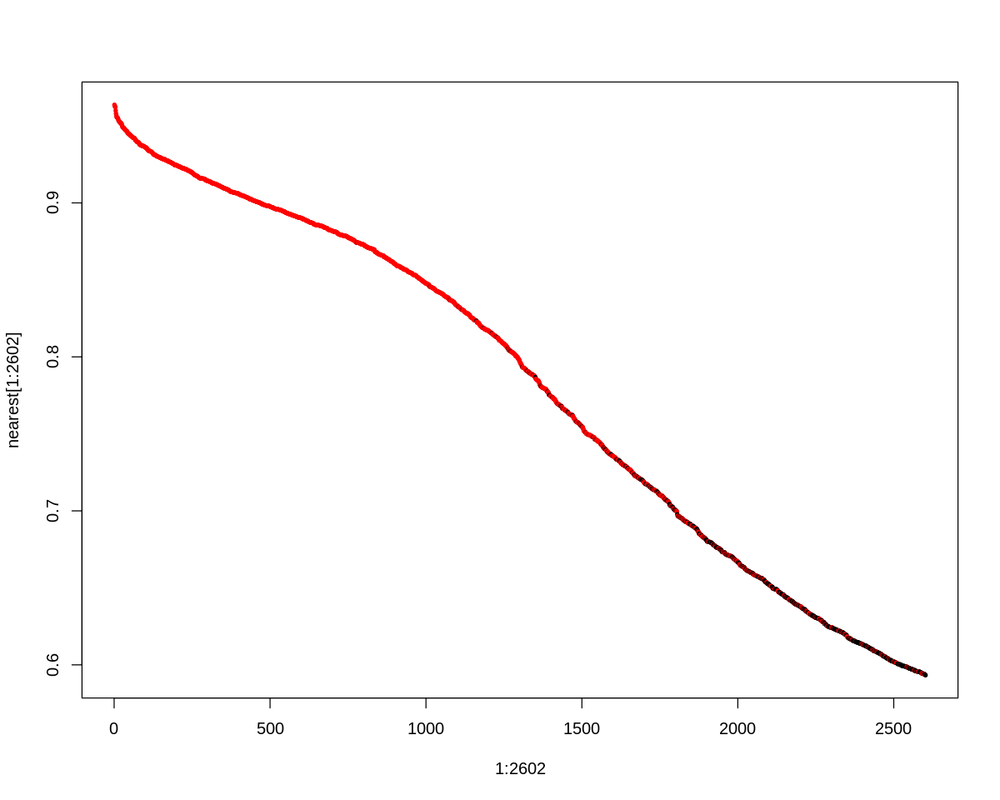

In [ ]:
nearest <- sort( cosines( dls[,1:7], NebbioloQuery$ls[1:7] ), decreasing=T )

damcols2 <- rep( "black", length(variety) )
damcols2[ variety == "Nebbiolo" ] <- "red" 

plot( 1:2602, nearest[1:2602], pch=20, cex=0.7, col=damcols2[strtoi(names(nearest))] )

In [ ]:
head(sort(cosines( tksrs[,1:7], NebbioloQuery$dksrs[1:7] ), decreasing = T),10)

underbrush    balsamic     chopped   assertive     menthol       whiff 
  0.9911598   0.9896074   0.9878842   0.9826762   0.9819482   0.9791069 
       star finegrained     truffle    nebbiolo 
  0.9768097   0.9744682   0.9690778   0.9597930

In [ ]:
sort(tnorms4[cosines(tksrs[,1:7],NebbioloQuery$dksrs[1:7])>0.95],decreasing = T)

balsamic       whiff     menthol     provide  underbrush finegrained 
   2.307497    2.269936    2.183567    1.969234    1.746657    1.741634 
       star   assertive     chopped    nebbiolo     truffle 
   1.731562    1.600924    1.509492    1.260607    1.101101

In [ ]:
NebbioloQuery <- makequery( "underbrush", tdm, lsar )
variety[top(cosines(dls[,1:7],NebbioloQuery$ls[1:7]),10)]
#reviews[top(cosines(dls[,1:7],NebbioloQuery$ls[1:7]),10)]
head(sort(table( variety[ top( cosines( dls[,1:7], NebbioloQuery$ls[1:7] ), 2602 ) ] ), decreasing = T))

[1] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"
 [7] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"


          Nebbiolo Cabernet Sauvignon         Pinot Noir              Syrah 
              1976                200                160                154 
            Merlot         Chardonnay 
                93                 11 

In [ ]:
head(sort(cosines( tksrs[,1:7], NebbioloQuery$dksrs[1:7] ), decreasing = T),10)

balsamic  underbrush   assertive     chopped finegrained       whiff 
  0.9805453   0.9800017   0.9761902   0.9692196   0.9670005   0.9642419 
       star     menthol    nebbiolo     truffle 
  0.9621561   0.9594293   0.9464671   0.9457191

In [ ]:
sort(tnorms4[cosines(tksrs[,1:7],NebbioloQuery$dksrs[1:7])>0.9],decreasing = T)

balsamic    delivers       whiff     menthol     provide  underbrush 
   2.307497    2.295561    2.269936    2.183567    1.969234    1.746657 
finegrained        star      flower   assertive     chopped        blue 
   1.741634    1.731562    1.674718    1.600924    1.509492    1.436985 
    bracing    nebbiolo      barolo     truffle 
   1.309379    1.260607    1.224297    1.101101

In [ ]:
NebbioloQuery <- makequery( "underbrush provide", tdm, lsar )
variety[top(cosines(dls[,1:7],NebbioloQuery$ls[1:7]),10)]
#reviews[top(cosines(dls[,1:7],NebbioloQuery$ls[1:7]),10)]
head(sort(table( variety[ top( cosines( dls[,1:7], NebbioloQuery$ls[1:7] ), 2602 ) ] ),decreasing = T))

[1] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"
 [7] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"


          Nebbiolo Cabernet Sauvignon         Pinot Noir              Syrah 
              1985                197                158                149 
            Merlot         Chardonnay 
                96                 10 

In [ ]:
sort(cosines( tksrs[,1:7], NebbioloQuery$dksrs[1:7] ), decreasing = T)[1:10]

balsamic  underbrush   assertive finegrained     chopped       whiff 
  0.9829912   0.9797404   0.9776243   0.9741777   0.9673946   0.9651675 
       star     menthol    nebbiolo     provide 
  0.9650281   0.9588534   0.9542586   0.9521066

In [ ]:
sort(tnorms4[cosines(tksrs[,1:7],NebbioloQuery$dksrs[1:7])>0.9],decreasing = T)

balsamic    delivers       whiff     menthol     provide  underbrush 
   2.307497    2.295561    2.269936    2.183567    1.969234    1.746657 
finegrained        star      flower   assertive     refined     chopped 
   1.741634    1.731562    1.674718    1.600924    1.561911    1.509492 
       blue      mature     bracing    nebbiolo      barolo     truffle 
   1.436985    1.409200    1.309379    1.260607    1.224297    1.101101

In [ ]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:7],NebbioloQuery$dksrs[1:7])>0.6],decreasing = T))) {
  NebbioloQuery <- makequery( paste("underbrush provide ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:7], NebbioloQuery$ls[1:7] ), 2602 ) ] )["Nebbiolo"]
  if(n>1980) {
    print(paste(newWord,":", n ))
  }
}

[1] "delivers : 1981"
[1] "provide : 1988"
[1] "underbrush : 1982"
[1] "finegrained : 1985"
[1] "star : 1981"
[1] "grilled : 1990"
[1] "assertive : 1985"
[1] "velvety : 1984"
[1] "chopped : 1981"
[1] "blue : 1981"
[1] "mature : 1991"
[1] "barolo : 1984"
[1] "exotic : 1982"
[1] "astringent : 1981"
[1] "truffle : 1981"
[1] "support : 1985"
[1] "firmly : 1986"
[1] "succulent : 1982"
[1] "close : 1984"
[1] "accessible : 1983"
[1] "loaded : 1989"
[1] "center : 1982"


In [ ]:
NebbioloQuery <- makequery( "underbrush mature grilled finegrained", tdm, lsar )
variety[top(cosines(dls[,1:7],NebbioloQuery$ls[1:7]),10)]
#reviews[top(cosines(dls[,1:7],NebbioloQuery$ls[1:7]),10)]
head(sort(table( variety[ top( cosines( dls[,1:7], NebbioloQuery$ls[1:7] ), 2602 ) ] ), decreasing = T))

[1] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"
 [7] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"


          Nebbiolo Cabernet Sauvignon         Pinot Noir              Syrah 
              1994                202                149                144 
            Merlot         Chardonnay 
                95                 11 

In [ ]:
sort(cosines( tksrs[,1:7], NebbioloQuery$dksrs[1:7] ), decreasing = T)[1:10]

balsamic  underbrush finegrained   assertive       whiff        star 
  0.9766493   0.9727441   0.9724665   0.9712137   0.9568250   0.9562686 
    chopped     provide     menthol    nebbiolo 
  0.9559767   0.9545512   0.9494267   0.9477528

In [ ]:
sort(tnorms4[cosines(tksrs[,1:7],NebbioloQuery$dksrs[1:7])>0.9],decreasing = T)

balsamic    delivers       whiff     menthol     provide  underbrush 
   2.307497    2.295561    2.269936    2.183567    1.969234    1.746657 
finegrained        star      flower   assertive     refined     chopped 
   1.741634    1.731562    1.674718    1.600924    1.561911    1.509492 
       blue      mature     bracing    nebbiolo      barolo     truffle 
   1.436985    1.409200    1.309379    1.260607    1.224297    1.101101 
    support 
   1.039561

In [ ]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:7],NebbioloQuery$dksrs[1:7])>0.6],decreasing = T))) {
  NebbioloQuery <- makequery( paste("underbrush mature grilled finegrained ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:7], NebbioloQuery$ls[1:7] ), 2602 ) ] )["Nebbiolo"]
  if(n>1990) {
    print(paste(newWord,":", n ))
  }
}

[1] "delivers : 1993"
[1] "provide : 1994"
[1] "underbrush : 1992"
[1] "finegrained : 1995"
[1] "grilled : 1996"
[1] "assertive : 1991"
[1] "tightly : 1997"
[1] "blue : 1991"
[1] "mature : 1993"
[1] "barolo : 1993"
[1] "truffle : 1991"
[1] "wound : 1994"
[1] "support : 1991"
[1] "emerge : 1991"
[1] "boasts : 1992"
[1] "close : 1991"
[1] "accessible : 1993"
[1] "slowly : 1991"
[1] "loaded : 1994"
[1] "center : 1992"


In [ ]:
NebbioloQuery <- makequery( "underbrush mature grilled finegrained tightly", tdm, lsar )
variety[top(cosines(dls[,1:7],NebbioloQuery$ls[1:7]),10)]
#reviews[top(cosines(dls[,1:7],NebbioloQuery$ls[1:7]),10)]
head(sort(table( variety[ top( cosines( dls[,1:7], NebbioloQuery$ls[1:7] ), 2602 ) ] ),decreasing = T))

[1] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"
 [7] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"


          Nebbiolo Cabernet Sauvignon              Syrah         Pinot Noir 
              1997                202                150                145 
            Merlot         Chardonnay 
                91                 10 

In [ ]:
sort(cosines( tksrs[,1:7], NebbioloQuery$dksrs[1:7] ), decreasing = T)[1:10]

balsamic  underbrush finegrained   assertive     chopped       whiff 
  0.9835596   0.9805353   0.9800843   0.9774807   0.9680322   0.9676283 
       star     menthol     provide     truffle 
  0.9628132   0.9611177   0.9610207   0.9579619

In [ ]:
sort(tnorms4[cosines(tksrs[,1:7],NebbioloQuery$dksrs[1:7])>0.96],decreasing = T)

balsamic       whiff     menthol     provide  underbrush finegrained 
   2.307497    2.269936    2.183567    1.969234    1.746657    1.741634 
       star   assertive     chopped 
   1.731562    1.600924    1.509492

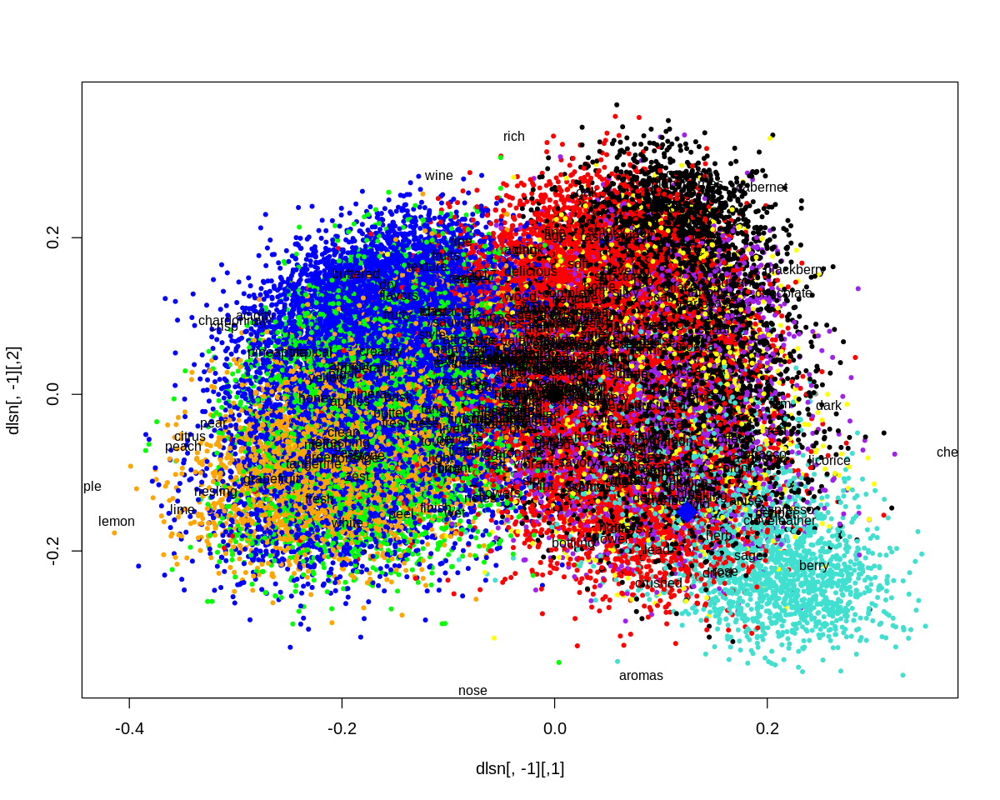

In [ ]:
plot( dlsn[,-1], pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto[,-1], labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(NebbioloQuery$ls)[2],normrows(NebbioloQuery$ls)[3],cex=3,pch=18,col="blue")

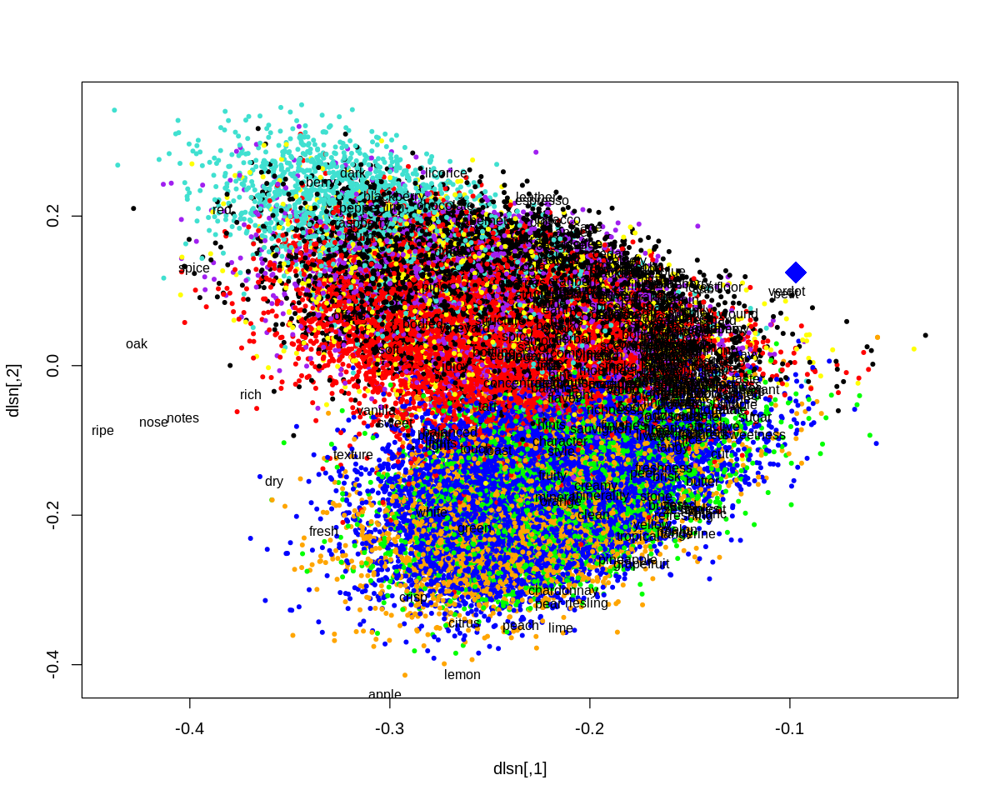

In [ ]:
plot( dlsn, pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto, labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(NebbioloQuery$ls),cex=3,pch=18,col="blue")

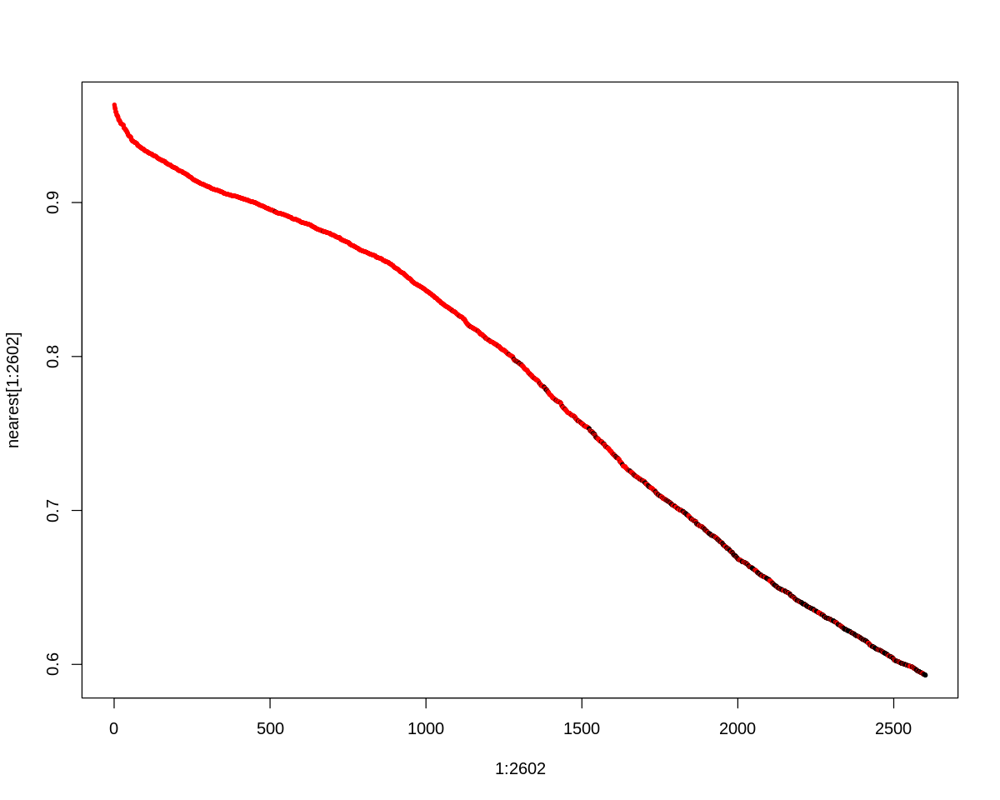

In [ ]:
nearest <- sort( cosines( dls[,1:7], NebbioloQuery$ls[1:7] ), decreasing=T )

damcols2 <- rep( "black", length(variety) )
damcols2[ variety == "Nebbiolo" ] <- "red" 

plot( 1:2602, nearest[1:2602], pch=20, cex=0.7, col=damcols2[strtoi(names(nearest))] )

In [ ]:
table(variety[top(cosines(dls[,1:7],NebbioloQuery$ls[1:7]),2602)])["Nebbiolo"]/2602

Nebbiolo 
0.7674865

In [ ]:
NebbioloQuery.vs.Nebbiolo <- table(1:nrow(dls) %in% top(cosines(dls[,1:7], NebbioloQuery$ls[1:7]), 2602), variety=="Nebbiolo" )
dimnames(NebbioloQuery.vs.Nebbiolo) <- list(NebbioloQuery = c("No", "Si"), NebbioloClass = c("No", "Si"))
NebbioloQuery.vs.Nebbiolo

c = chisq.test( NebbioloQuery.vs.Nebbiolo, correct=FALSE )
c$expected
c$p.value

             NebbioloClass
NebbioloQuery    No    Si
           No 48234   605
           Si   605  1997

,No,Si
No,46368.615,2470.3851
Si,2470.385,131.6149


[1] 0

### **Analisi Pinot Noir**

In [ ]:
raspberries.vs.PinotNoir <- table( tdm["raspberries",]>0, variety=="Pinot Noir")
dimnames(raspberries.vs.PinotNoir) <- list(raspberries = c("No", "Si"), PinotNoir = c("No", "Si"))
chisqtest = chisq.test( raspberries.vs.PinotNoir, correct=FALSE )
chisqtest
chisqtest$expected
chisqtest$observed


	Pearson's Chi-squared test

data:  raspberries.vs.PinotNoir
X-squared = 1158.5, df = 1, p-value < 2.2e-16


,No,Si
No,38487.1703,12064.8297
Si,676.8297,212.1703


           PinotNoir
raspberries    No    Si
         No 38916 11636
         Si   248   641

In [ ]:
table(variety)["Pinot Noir"]/length(variety)

Pinot Noir 
 0.2386618

In [ ]:
PinotNoirQuery <- makequery( "raspberries", tdm, lsar )
variety[top(cosines(dls[,1:7],PinotNoirQuery$ls[1:7]),10)]
#reviews[top(cosines(dls[,1:7],PinotNoirQuery$ls[1:7]),10)]
table( variety[ top( cosines( dls[,1:7], PinotNoirQuery$ls[1:7] ), 12277 ) ] )["Pinot Noir"]

[1] "Pinot Noir"         "Pinot Noir"         "Pinot Noir"        
 [4] "Pinot Noir"         "Cabernet Sauvignon" "Pinot Noir"        
 [7] "Pinot Noir"         "Pinot Noir"         "Pinot Noir"        
[10] "Pinot Noir"

Pinot Noir 
      6733

In [ ]:
sort(cosines( tksrs[,1:7], PinotNoirQuery$dksrs[1:7] ), decreasing = T)[1:10]

raspberries       silky  sandalwood        noir       pinot        cola 
  0.9857640   0.9633339   0.9505650   0.9450425   0.9447739   0.9437930 
   cherries   mushrooms       coast      pinots 
  0.9246319   0.9128620   0.8853210   0.8724335

In [ ]:
sort(tnorms4[cosines(tksrs[,1:7],PinotNoirQuery$dksrs[1:7])>0.9],decreasing = T)

pinot        noir        cola    cherries       silky raspberries 
  8.5476523   6.6035842   4.6212664   4.3589269   3.9175864   2.5229877 
 sandalwood   mushrooms 
  1.7941682   0.8349519

In [ ]:
PinotNoirQuery <- makequery( "mushroom", tdm, lsar )
variety[top(cosines(dls[,1:7],PinotNoirQuery$ls[1:7]),10)]
#reviews[top(cosines(dls[,1:7],PinotNoirQuery$ls[1:7]),10)]
table( variety[ top( cosines( dls[,1:7], PinotNoirQuery$ls[1:7] ), 12277 ) ] )["Pinot Noir"]

[1] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"
 [6] "Pinot Noir" "Pinot Noir" "Syrah"      "Pinot Noir" "Pinot Noir"

Pinot Noir 
      8473

In [ ]:
sort(cosines( tksrs[,1:7], PinotNoirQuery$dksrs[1:7] ), decreasing = T)[1:10]

mushroom  mushrooms       noir      pinot       cola      silky sandalwood 
 0.9536627  0.9489885  0.9266624  0.9265193  0.9229114  0.9179690  0.8981339 
     coast     pinots  raspberry 
 0.8765271  0.8664408  0.8470393

In [ ]:
sort(tnorms4[cosines(tksrs[,1:7],PinotNoirQuery$dksrs[1:7])>0.8],decreasing = T)

pinot        noir   raspberry        cola       silky raspberries 
  8.5476523   6.6035842   5.0095061   4.6212664   3.9175864   2.5229877 
 sandalwood pomegranate     rhubarb    mushroom   mushrooms      petals 
  1.7941682   1.7364405   1.0225560   0.8984347   0.8349519   0.8170203 
     pinots      oregon     coastal       coast  earthiness 
  0.7618692   0.6911726   0.6389852   0.6126530   0.5103515

In [ ]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:7],PinotNoirQuery$dksrs[1:7])>0.6],decreasing = T))) {
  PinotNoirQuery <- makequery( paste("mushroom ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:7], PinotNoirQuery$ls[1:7] ), 12277 ) ] )["Pinot Noir"]
  if(n>8450) {
    print(paste(newWord,":", n ))
  }
}

[1] "rhubarb : 8525"
[1] "mushroom : 8473"
[1] "pinots : 8461"
[1] "oregon : 8689"
[1] "singlevineyard : 8533"
[1] "coastal : 8486"
[1] "river : 8480"


In [ ]:
PinotNoirQuery <- makequery( "mushroom oregon", tdm, lsar )
variety[top(cosines(dls[,1:7],PinotNoirQuery$ls[1:7]),10)]
#reviews[top(cosines(dls[,1:7],PinotNoirQuery$ls[1:7]),10)]
head(sort(table( variety[ top( cosines( dls[,1:7], PinotNoirQuery$ls[1:7] ), 12277 ) ] ), decreasing = T))

[1] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"
 [6] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"


        Pinot Noir              Syrah Cabernet Sauvignon             Merlot 
              8689               1053               1039                790 
        Chardonnay           Nebbiolo 
               243                228 

In [ ]:
sort(cosines( tksrs[,1:7], PinotNoirQuery$dksrs[1:7] ), decreasing = T)[1:10]

oregon     pinot      noir mushrooms    pinots     coast   rhubarb     silky 
0.9439673 0.9408949 0.9403471 0.9170447 0.9138337 0.9002354 0.9000936 0.8954282 
     cola  mushroom 
0.8901506 0.8851679

In [ ]:
sort(tnorms4[cosines(tksrs[,1:7],PinotNoirQuery$dksrs[1:7])>0.9],decreasing = T)

pinot      noir   rhubarb mushrooms    pinots    oregon     coast 
8.5476523 6.6035842 1.0225560 0.8349519 0.7618692 0.6911726 0.6126530

In [ ]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:7],PinotNoirQuery$dksrs[1:7])>0.6],decreasing = T))) {
  PinotNoirQuery <- makequery( paste("mushroom oregon ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:7], PinotNoirQuery$ls[1:7] ), 12277 ) ] )["Pinot Noir"]
  if(n>8650) {
    print(paste(newWord,":", n ))
  }
}

[1] "berries : 8666"
[1] "mushroom : 8686"
[1] "gentle : 8663"
[1] "oregon : 8656"
[1] "planted : 8724"


In [ ]:
PinotNoirQuery <- makequery( "mushroom oregon planted mushroom", tdm, lsar )
variety[top(cosines(dls[,1:7],PinotNoirQuery$ls[1:7]),10)]
#reviews[top(cosines(dls[,1:7],PinotNoirQuery$ls[1:7]),10)]
table( variety[ top( cosines( dls[,1:7], PinotNoirQuery$ls[1:7] ), 12277 ) ] )["Pinot Noir"]

[1] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"
 [6] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"

Pinot Noir 
      8739

In [ ]:
sort(cosines( tksrs[,1:7], PinotNoirQuery$dksrs[1:7] ), decreasing = T)[1:10]

oregon     rhubarb      pinots       pinot        noir   mushrooms 
  0.9516478   0.9395446   0.9046485   0.8960776   0.8946303   0.8925225 
pomegranate    mushroom       coast     coastal 
  0.8850569   0.8776450   0.8726931   0.8512469

In [ ]:
sort(tnorms4[cosines(tksrs[,1:7],PinotNoirQuery$dksrs[1:7])>0.8],decreasing = T)

pinot        noir        cola       silky  strawberry  sandalwood 
  8.5476523   6.6035842   4.6212664   3.9175864   2.5015844   1.7941682 
pomegranate     rhubarb    mushroom   mushrooms      petals      pinots 
  1.7364405   1.0225560   0.8984347   0.8349519   0.8170203   0.7618692 
     oregon     coastal       river       coast  earthiness 
  0.6911726   0.6389852   0.6128365   0.6126530   0.5103515

In [ ]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:7],PinotNoirQuery$dksrs[1:7])>0.6],decreasing = T))) {
  PinotNoirQuery <- makequery( paste("mushroom oregon planted mushroom ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:7], PinotNoirQuery$ls[1:7] ), 12277 ) ] )["Pinot Noir"]
  if(n>8735) {
    print(paste(newWord,":", n ))
  }
}

[1] "red : 8775"
[1] "mushroom : 8750"
[1] "gentle : 8782"
[1] "planted : 8761"


In [ ]:
PinotNoirQuery <- makequery( "oregon planted mushroom red", tdm, lsar )
variety[top(cosines(dls[,1:7],PinotNoirQuery$ls[1:7]),10)]
#reviews[top(cosines(dls[,1:7],PinotNoirQuery$ls[1:7]),10)]
table( variety[ top( cosines( dls[,1:7], PinotNoirQuery$ls[1:7] ), 12277 ) ] )["Pinot Noir"]

[1] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"
 [6] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"

Pinot Noir 
      8802

In [ ]:
sort(cosines( tksrs[,1:7], PinotNoirQuery$dksrs[1:7] ), decreasing = T)[1:10]

strawberry     rhubarb pomegranate   raspberry    mushroom      petals 
  0.9190244   0.8801192   0.8729000   0.8648387   0.8595953   0.8448583 
        red      oregon   cranberry      pinots 
  0.8425330   0.8292175   0.8044152   0.8003901

In [ ]:
sort(tnorms4[cosines(tksrs[,1:7],PinotNoirQuery$dksrs[1:7])>0.8],decreasing = T)

red   raspberry   cranberry  strawberry pomegranate     rhubarb 
  5.7329537   5.0095061   3.2657481   2.5015844   1.7364405   1.0225560 
   mushroom      petals      pinots      oregon 
  0.8984347   0.8170203   0.7618692   0.6911726

In [ ]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:7],PinotNoirQuery$dksrs[1:7])>0.6],decreasing = T))) {
  PinotNoirQuery <- makequery( paste("oregon planted mushroom red ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:7], PinotNoirQuery$ls[1:7] ), 12277 ) ] )["Pinot Noir"]
  if(n>8800) {
    print(paste(newWord,":", n ))
  }
}

[1] "mushrooms : 8848"
[1] "gentle : 8951"
[1] "pinots : 8893"
[1] "oregon : 8868"
[1] "planted : 8844"
[1] "singlevineyard : 8820"
[1] "coastal : 8865"
[1] "selection : 8861"
[1] "river : 8915"
[1] "coast : 8867"
[1] "earthiness : 8826"


In [ ]:
PinotNoirQuery <- makequery( "oregon planted mushroom red gentle river ", tdm, lsar )
variety[top(cosines(dls[,1:7],PinotNoirQuery$ls[1:7]),10)]
#reviews[top(cosines(dls[,1:7],PinotNoirQuery$ls[1:7]),10)]
table( variety[ top( cosines( dls[,1:7], PinotNoirQuery$ls[1:7] ), 12277 ) ] )["Pinot Noir"]

[1] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"
 [6] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"

Pinot Noir 
      8970

In [ ]:
sort(cosines( tksrs[,1:7], PinotNoirQuery$dksrs[1:7] ), decreasing = T)[1:10]

oregon  strawberry     rhubarb      pinots    mushroom       pinot 
  0.8801630   0.8757512   0.8695217   0.8642580   0.8586103   0.8381800 
       noir pomegranate   mushrooms   raspberry 
  0.8366711   0.8339709   0.8286207   0.8199064

In [ ]:
sort(tnorms4[cosines(tksrs[,1:7],PinotNoirQuery$dksrs[1:7])>0.80],decreasing = T)

pinot        noir   raspberry        cola  strawberry pomegranate 
  8.5476523   6.6035842   5.0095061   4.6212664   2.5015844   1.7364405 
    rhubarb    mushroom   mushrooms      pinots      oregon       coast 
  1.0225560   0.8984347   0.8349519   0.7618692   0.6911726   0.6126530

In [ ]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:7],PinotNoirQuery$dksrs[1:7])>0.6],decreasing = T))) {
  PinotNoirQuery <- makequery( paste("oregon planted mushroom red gentle river ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:7], PinotNoirQuery$ls[1:7] ), 12277 ) ] )["Pinot Noir"]
  if(n>8960) {
    print(paste(newWord,":", n ))
  }
}

[1] "mushroom : 8961"
[1] "gentle : 8965"
[1] "oregon : 8976"
[1] "planted : 8973"
[1] "selection : 8965"
[1] "river : 8963"


In [ ]:
PinotNoirQuery <- makequery( "oregon planted mushroom red gentle river ", tdm, lsar )
variety[top(cosines(dls[,1:7],PinotNoirQuery$ls[1:7]),10)]
#reviews[top(cosines(dls[,1:7],PinotNoirQuery$ls[1:7]),10)]
table( variety[ top( cosines( dls[,1:7], PinotNoirQuery$ls[1:7] ), 12277 ) ] )["Pinot Noir"]

[1] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"
 [6] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"

Pinot Noir 
      8970

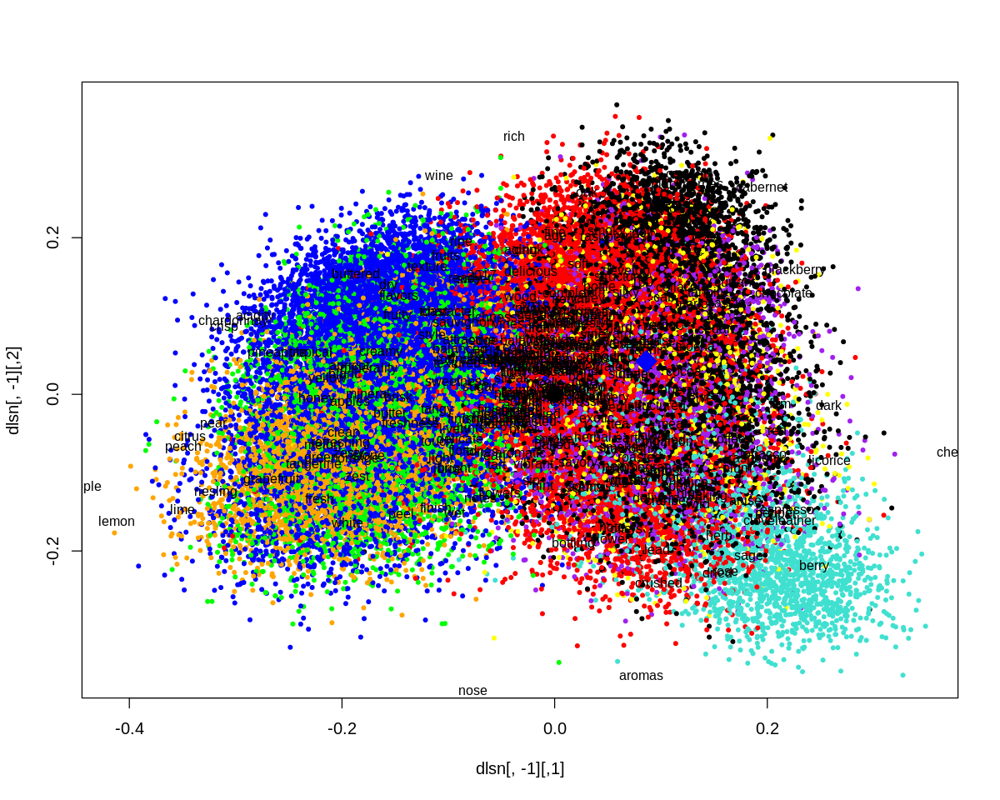

In [ ]:
plot( dlsn[,-1], pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto[,-1], labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(PinotNoirQuery$ls)[2],normrows(PinotNoirQuery$ls)[3],cex=3,pch=18,col="blue")

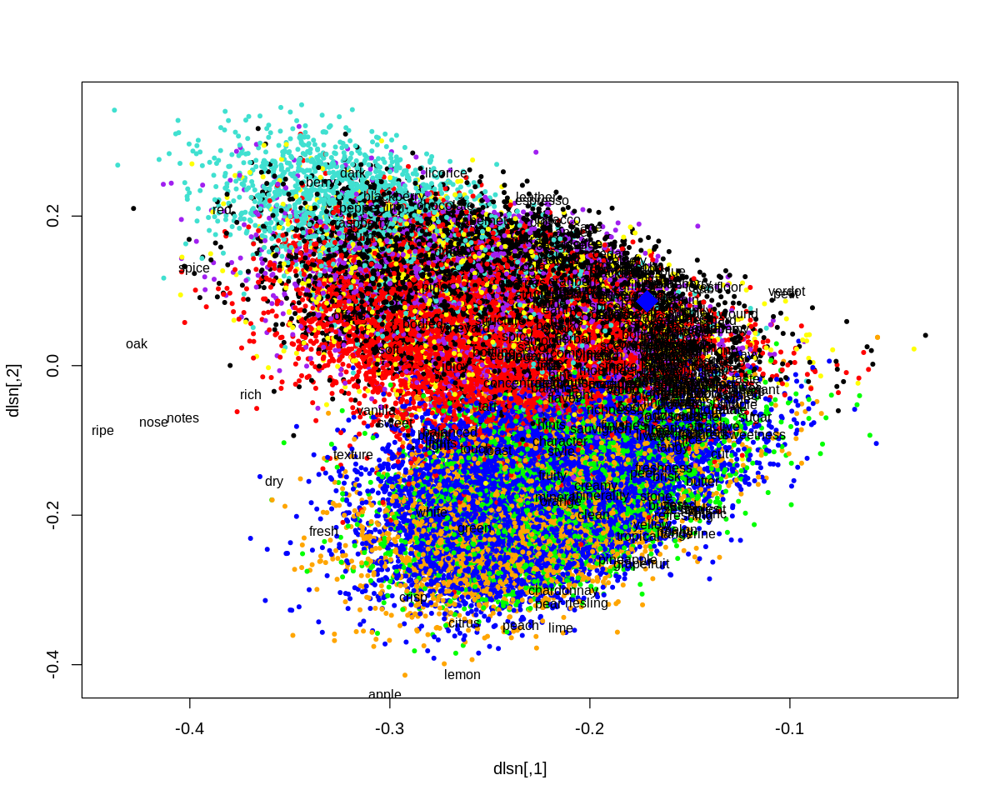

In [ ]:
plot( dlsn, pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto, labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(PinotNoirQuery$ls),cex=3,pch=18,col="blue")

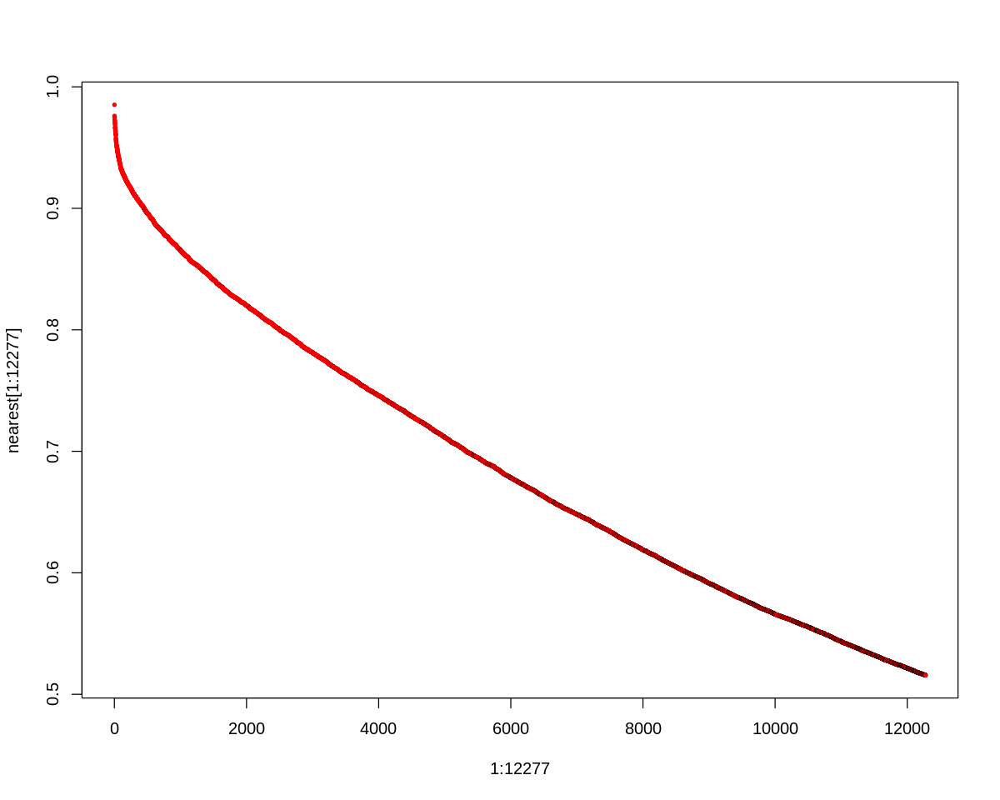

In [ ]:
nearest <- sort( cosines( dls[,1:7], PinotNoirQuery$ls[1:7] ), decreasing=T )

damcols2 <- rep( "black", length(variety) )
damcols2[ variety == "Pinot Noir" ] <- "red" 

plot( 1:12277, nearest[1:12277], pch=20, cex=0.7, col=damcols2[strtoi(names(nearest))] )

In [ ]:
table(variety[top(cosines(dls[,1:7],PinotNoirQuery$ls[1:7]),12277)])["Pinot Noir"]/12277

Pinot Noir 
 0.7306345

In [ ]:
PinotNoirQuery.vs.PinotNoir <- table(1:nrow(dls) %in% top(cosines(dls[,1:7], PinotNoirQuery$ls[1:7]), 12277), variety=="Pinot Noir" )
dimnames(PinotNoirQuery.vs.PinotNoir) <- list(PinotNoirQuery = c("No", "Si"), PinotNoir = c("No", "Si"))
PinotNoirQuery.vs.PinotNoir

c = chisq.test( PinotNoirQuery.vs.PinotNoir, correct=FALSE )
c$expected
c$p.value

              PinotNoir
PinotNoirQuery    No    Si
            No 35857  3307
            Si  3307  8970

,No,Si
No,29817.051,9346.949
Si,9346.949,2930.051


[1] 0

### **Analisi Chardonnay**

In [ ]:
head(sort(table(variety), decreasing = T),15)

variety
        Pinot Noir         Chardonnay Cabernet Sauvignon           Riesling 
             12277              10867               8837               4773 
             Syrah    Sauvignon Blanc             Merlot           Nebbiolo 
              4616               4574               2895               2602 

In [ ]:
tropical.vs.Chardonnay <- table( tdm["tropical",]>0, variety=="Chardonnay")
dimnames(tropical.vs.Chardonnay) <- list(tropical = c("No", "Si"), Chardonnay = c("No", "Si"))
chisqtest = chisq.test( tropical.vs.Chardonnay, correct=FALSE )
chisqtest
chisqtest$expected
chisqtest$observed


	Pearson's Chi-squared test

data:  tropical.vs.Chardonnay
X-squared = 1960.2, df = 1, p-value < 2.2e-16


,No,Si
No,39101.407,10472.593
Si,1472.593,394.407


        Chardonnay
tropical    No    Si
      No 39868  9706
      Si   706  1161

In [ ]:
ChardonnayQuery <- makequery( "tropical", tdm, lsar )
variety[top(cosines(dls[,1:7],ChardonnayQuery$ls[1:7]),20)]
#reviews[top(cosines(dls[,1:7],ChardonnayQuery$ls[1:7]),20)]
table( variety[ top( cosines( dls[,1:7], ChardonnayQuery$ls[1:7] ), 10867 ) ] )["Chardonnay"]

[1] "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay"
 [6] "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay"
[11] "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay"
[16] "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay"

Chardonnay 
      7578

In [ ]:
sort(cosines( tksrs[,1:7], ChardonnayQuery$dksrs[1:7] ), decreasing = T)[1:10]

tropical         lees   chardonnay       creamy butterscotch        chard 
   0.9679640    0.9669507    0.9607961    0.9565785    0.9441994    0.9423170 
       cream    pineapple        pears      buttery 
   0.9340841    0.9188055    0.9127558    0.9107369

In [ ]:
sort(tnorms4[cosines(tksrs[,1:7],ChardonnayQuery$dksrs[1:7])>0.9],decreasing = T)

chardonnay    pineapple       creamy     tropical       butter        cream 
   5.4805100    4.0327513    3.2784211    3.2124913    1.6008277    1.4157015 
butterscotch      buttery        chard        pears       golden         lees 
   1.2936732    1.2347875    1.1470939    0.9850834    0.8980546    0.7727937 
      papaya fermentation 
   0.6957930    0.6229137

In [ ]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:7],ChardonnayQuery$dksrs[1:7])>0.6],decreasing = T))) {
  ChardonnayQuery <- makequery( paste("tropical ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:7], ChardonnayQuery$ls[1:7] ), 10867 ) ] )["Chardonnay"]
  if(n>7600) {
    print(paste(newWord,":", n ))
  }
}

[1] "pear : 7709"
[1] "apricot : 7637"
[1] "richness : 7603"
[1] "pears : 7606"
[1] "almond : 7659"
[1] "steel : 7624"
[1] "apricots : 7777"


In [ ]:
ChardonnayQuery <- makequery( "tropical apricots ", tdm, lsar )
variety[top(cosines(dls[,1:7],ChardonnayQuery$ls[1:7]),20)]
#reviews[top(cosines(dls[,1:7],ChardonnayQuery$ls[1:7]),20)]
table( variety[ top( cosines( dls[,1:7], ChardonnayQuery$ls[1:7] ), 10867 ) ] )["Chardonnay"]

[1] "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay"
 [6] "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay"
[11] "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay"
[16] "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay"

Chardonnay 
      7777

In [ ]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:7],ChardonnayQuery$dksrs[1:7])>0.6],decreasing = T))) {
  ChardonnayQuery <- makequery( paste("tropical apricots ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:7], ChardonnayQuery$ls[1:7] ), 10867 ) ] )["Chardonnay"]
  if(n>7780) {
    print(paste(newWord,":", n ))
  }
}

[1] "pear : 7789"
[1] "apples : 7911"
[1] "almond : 7803"
[1] "apricots : 7839"


In [ ]:
ChardonnayQuery <- makequery( "tropical apricots apples", tdm, lsar )
variety[top(cosines(dls[,1:7],ChardonnayQuery$ls[1:7]),20)]
#reviews[top(cosines(dls[,1:7],ChardonnayQuery$ls[1:7]),20)]
table( variety[ top( cosines( dls[,1:7], ChardonnayQuery$ls[1:7] ), 10867 ) ] )["Chardonnay"]

[1] "Chardonnay"      "Chardonnay"      "Chardonnay"      "Chardonnay"     
 [5] "Chardonnay"      "Chardonnay"      "Sauvignon Blanc" "Chardonnay"     
 [9] "Sauvignon Blanc" "Chardonnay"      "Chardonnay"      "Chardonnay"     
[13] "Chardonnay"      "Chardonnay"      "Chardonnay"      "Chardonnay"     
[17] "Chardonnay"      "Riesling"        "Chardonnay"      "Chardonnay"

Chardonnay 
      6938

In [ ]:
sort(cosines( tksrs[,1:7], ChardonnayQuery$dksrs[1:7] ), decreasing = T)[1:10]

tropical      pears       lees chardonnay     creamy     golden       pear 
 0.9799322  0.9569468  0.9459875  0.9309687  0.9294231  0.9206669  0.9108043 
 pineapple     papaya      chard 
 0.9042800  0.8956743  0.8942657

In [ ]:
sort(tnorms4[cosines(tksrs[,1:7],ChardonnayQuery$dksrs[1:7])>0.9],decreasing = T)

chardonnay       pear  pineapple     creamy   tropical      pears     golden 
 5.4805100  4.2110906  4.0327513  3.2784211  3.2124913  0.9850834  0.8980546 
      lees 
 0.7727937

In [ ]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:7],ChardonnayQuery$dksrs[1:7])>0.6],decreasing = T))) {
  ChardonnayQuery <- makequery( paste("tropical apricots apples ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:7], ChardonnayQuery$ls[1:7] ), 10867 ) ] )["Chardonnay"]
  if(n>7910) {
    print(paste(newWord,":", n ))
  }
}

[1] "richness : 7976"
[1] "opulent : 7961"
[1] "dominate : 7968"
[1] "apricots : 7956"
[1] "crispness : 8016"


In [ ]:
ChardonnayQuery <- makequery( "tropical apricots apples crispness", tdm, lsar )
variety[top(cosines(dls[,1:7],ChardonnayQuery$ls[1:7]),20)]
#reviews[top(cosines(dls[,1:7],ChardonnayQuery$ls[1:7]),20)]
table( variety[ top( cosines( dls[,1:7], ChardonnayQuery$ls[1:7] ), 10867 ) ] )["Chardonnay"]

[1] "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay"
 [6] "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay"
[11] "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay"
[16] "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay"

Chardonnay 
      8016

In [ ]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:7],ChardonnayQuery$dksrs[1:7])>0.6],decreasing = T))) {
  ChardonnayQuery <- makequery( paste("tropical apricots apples crispness ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:7], ChardonnayQuery$ls[1:7] ), 10867 ) ] )["Chardonnay"]
  if(n>8010) {
    print(paste(newWord,":", n ))
  }
}

[1] "richness : 8064"
[1] "warm : 8104"
[1] "months : 8018"
[1] "opulent : 8051"
[1] "dominate : 8062"
[1] "apricots : 8055"
[1] "crispness : 8043"


In [ ]:
ChardonnayQuery <- makequery( "tropical apricots apples crispness warm", tdm, lsar )
variety[top(cosines(dls[,1:7],ChardonnayQuery$ls[1:7]),20)]
#reviews[top(cosines(dls[,1:7],ChardonnayQuery$ls[1:7]),20)]
head(sort(table( variety[ top( cosines( dls[,1:7], ChardonnayQuery$ls[1:7] ), 10867 ) ] ),decreasing = T))

[1] "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay"
 [6] "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay"
[11] "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay"
[16] "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay"


        Chardonnay    Sauvignon Blanc           Riesling         Pinot Noir 
              8104               1615                726                247 
Cabernet Sauvignon              Syrah 
                67                 61 

In [ ]:
sort(cosines( tksrs[,1:7], ChardonnayQuery$dksrs[1:7] ), decreasing = T)[1:10]

tropical       creamy     apricots         lees        pears         pear 
   0.9295211    0.9235019    0.8931860    0.8829080    0.8813458    0.8504431 
   fermented      buttery fermentation     dominate 
   0.8503649    0.8406914    0.8381247    0.8343218

In [ ]:
sort(tnorms4[cosines(tksrs[,1:7],ChardonnayQuery$dksrs[1:7])>0.8],decreasing = T)

chardonnay         pear       creamy     tropical       butter      buttery 
   5.4805100    4.2110906    3.2784211    3.2124913    1.6008277    1.2347875 
       pears    fermented       golden       almond         lees       papaya 
   0.9850834    0.8990448    0.8980546    0.8163011    0.7727937    0.6957930 
   stainless     dominate     apricots fermentation 
   0.6772211    0.6668371    0.6537348    0.6229137

In [ ]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:7],ChardonnayQuery$dksrs[1:7])>0.6],decreasing = T))) {
  ChardonnayQuery <- makequery( paste("tropical apricots apples crispness warm ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:7], ChardonnayQuery$ls[1:7] ), 10867 ) ] )["Chardonnay"]
  if(n>8100) {
    print(paste(newWord,":", n ))
  }
}

[1] "peaches : 8104"
[1] "apricots : 8109"


In [ ]:
ChardonnayQuery <- makequery( "tropical apricots apples crispness warm peaches", tdm, lsar )
variety[top(cosines(dls[,1:7],ChardonnayQuery$ls[1:7]),20)]
#reviews[top(cosines(dls[,1:7],ChardonnayQuery$ls[1:7]),20)]
head(sort(table( variety[ top( cosines( dls[,1:7], ChardonnayQuery$ls[1:7] ), 10867 ) ] ),decreasing = T))

[1] "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay"
 [6] "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay"
[11] "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay"
[16] "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay" "Chardonnay"


        Chardonnay    Sauvignon Blanc           Riesling         Pinot Noir 
              8104               1565                808                215 
Cabernet Sauvignon              Syrah 
                68                 61 

In [ ]:
table(variety)["Chardonnay"]/length(variety)

Chardonnay 
 0.2112517

In [ ]:
table( variety[ top( cosines( dls[,1:7], ChardonnayQuery$ls[1:7] ), 10867 ) ] )["Chardonnay"]/table(variety)["Chardonnay"]

Chardonnay 
  0.745744

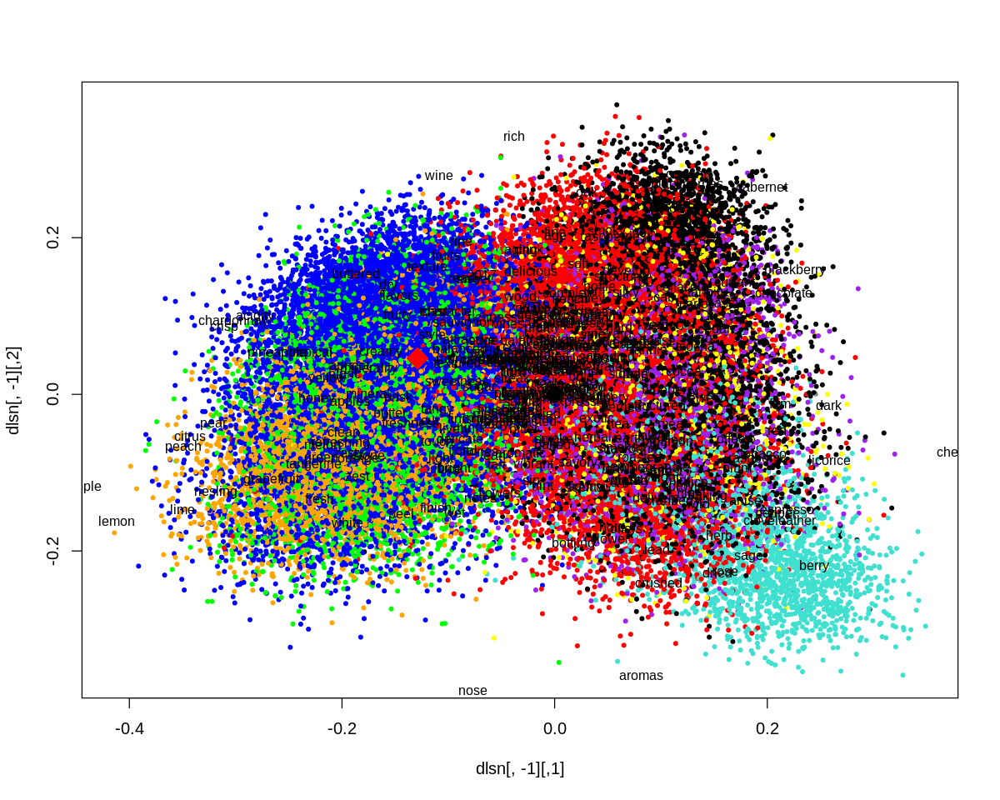

In [ ]:
plot( dlsn[,-1], pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto[,-1], labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(ChardonnayQuery$ls)[2],normrows(ChardonnayQuery$ls)[3],cex=3,pch=18,col="red")

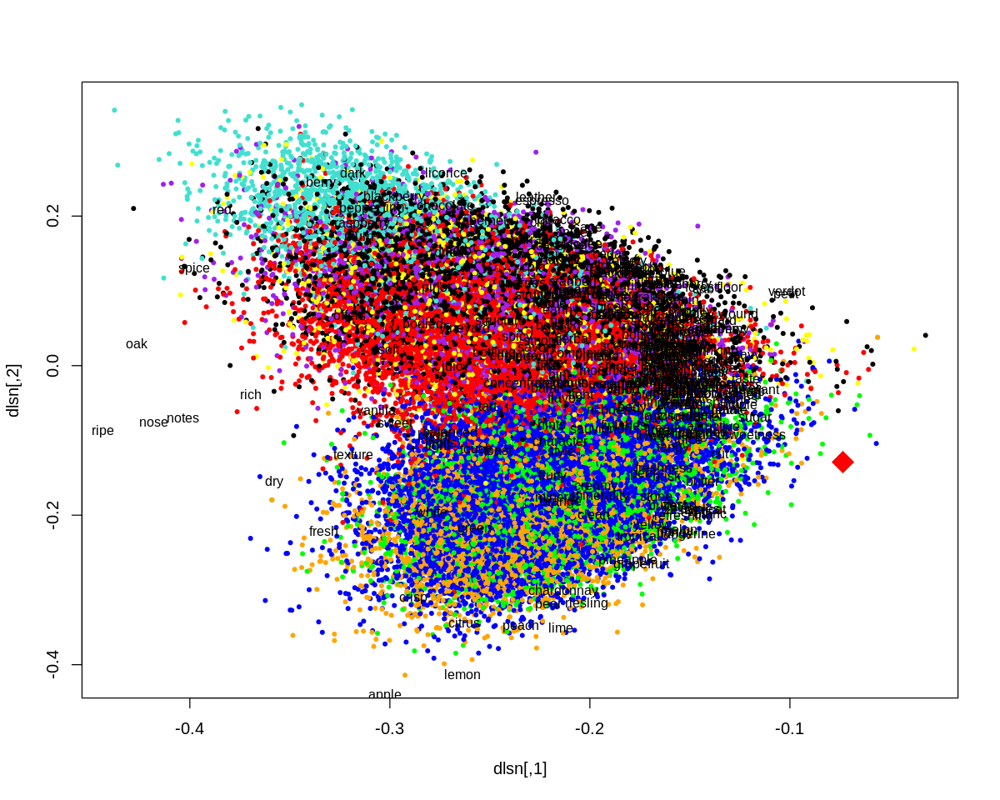

In [ ]:
plot( dlsn, pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto, labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(ChardonnayQuery$ls),cex=3,pch=18,col="red")

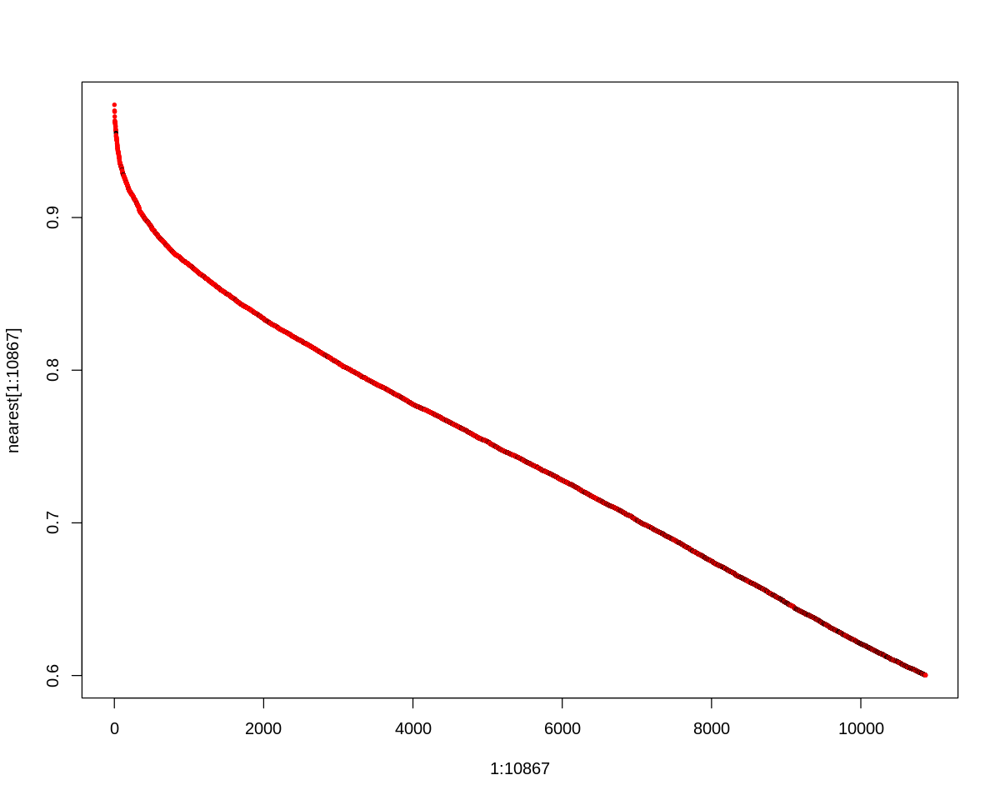

In [ ]:
nearest <- sort( cosines( dls[,1:7], ChardonnayQuery$ls[1:7] ), decreasing=T )

damcols2 <- rep( "black", length(variety) )
damcols2[ variety == "Chardonnay" ] <- "red" 

plot( 1:10867, nearest[1:10867], pch=20, cex=0.7, col=damcols2[strtoi(names(nearest))] )

In [ ]:
ChardonnayQuery.vs.Chardonnay <- table(1:nrow(dls) %in% top(cosines(dls[,1:7], ChardonnayQuery$ls[1:7]), 10867), variety=="Chardonnay" )
dimnames(ChardonnayQuery.vs.Chardonnay) <- list(ChardonnayQuery = c("No", "Si"), Chardonnay = c("No", "Si"))
ChardonnayQuery.vs.Chardonnay

c = chisq.test( ChardonnayQuery.vs.Chardonnay, correct=FALSE )
c$expected
c$p.value

               Chardonnay
ChardonnayQuery    No    Si
             No 37811  2763
             Si  2763  8104

,No,Si
No,32002.672,8571.328
Si,8571.328,2295.672


[1] 0

### **Analisi Cabernet Sauvignon**

In [ ]:
blackberry.vs.CabernetSauvignon <- table( tdm["blackberry",]>0, variety=="Cabernet Sauvignon")
dimnames(blackberry.vs.CabernetSauvignon) <- list(blackberry = c("No", "Si"), CabernetSauvignon = c("No", "Si"))
chisqtest = chisq.test( blackberry.vs.CabernetSauvignon, correct=FALSE )
chisqtest
chisqtest$expected
chisqtest$observed


	Pearson's Chi-squared test

data:  blackberry.vs.CabernetSauvignon
X-squared = 4173, df = 1, p-value < 2.2e-16


,No,Si
No,39264.653,8144.3466
Si,3339.347,692.6534


          CabernetSauvignon
blackberry    No    Si
        No 40750  6659
        Si  1854  2178

In [ ]:
CabernetSauvignonQuery <- makequery( "blackberry", tdm, lsar )
variety[top(cosines(dls[,1:7],CabernetSauvignonQuery$ls[1:7]),20)]
#reviews[top(cosines(dls[,1:7],CabernetSauvignonQuery$ls[1:7]),30)]
table( variety[ top( cosines( dls[,1:7], CabernetSauvignonQuery$ls[1:7] ), 8837 ) ] )["Cabernet Sauvignon"]

[1] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
 [4] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
 [7] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
[10] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
[13] "Cabernet Sauvignon" "Merlot"             "Merlot"            
[16] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
[19] "Syrah"              "Merlot"

Cabernet Sauvignon 
              5426

In [ ]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:7],CabernetSauvignonQuery$dksrs[1:7])>0.6],decreasing = T))) {
  CabernetSauvignonQuery <- makequery( paste("blackberry cassis ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:7], CabernetSauvignonQuery$ls[1:7] ), 8837 ) ] )["Cabernet Sauvignon"]
  if(n>5420) {
    print(paste(newWord,":", n ))
  }
}

[1] "blackberry : 5425"
[1] "cassis : 5429"
[1] "merlot : 5421"
[1] "100 : 5422"
[1] "verdot : 5423"
[1] "petit : 5426"
[1] "franc : 5432"
[1] "bold : 5425"
[1] "blended : 5424"
[1] "robust : 5429"
[1] "extracted : 5429"


In [ ]:
CabernetSauvignonQuery <- makequery( "blackberry cassis", tdm, lsar )
variety[top(cosines(dls[,1:7],CabernetSauvignonQuery$ls[1:7]),20)]
#reviews[top(cosines(dls[,1:7],CabernetSauvignonQuery$ls[1:7]),30)]
sort(table( variety[ top( cosines( dls[,1:7], CabernetSauvignonQuery$ls[1:7] ), 8837 ) ] ), decreasing = T)

[1] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
 [4] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
 [7] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
[10] "Cabernet Sauvignon" "Cabernet Sauvignon" "Merlot"            
[13] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
[16] "Cabernet Sauvignon" "Merlot"             "Cabernet Sauvignon"
[19] "Cabernet Sauvignon" "Cabernet Sauvignon"


Cabernet Sauvignon              Syrah             Merlot         Pinot Noir 
              5429               1762               1065                488 
          Nebbiolo    Sauvignon Blanc         Chardonnay           Riesling 
                59                 25                  6                  3 

In [ ]:
sort(cosines( tksrs[,1:7], CabernetSauvignonQuery$dksrs[1:7] ), decreasing = T)[1:10]

verdot      petit      franc     cassis blackberry   cabernet    blended 
 0.9891796  0.9880779  0.9852716  0.9693829  0.9625126  0.9599249  0.9547305 
       cab     merlot        100 
 0.9385460  0.9287983  0.9198618

In [ ]:
sort(tnorms4[cosines(tksrs[,1:7],CabernetSauvignonQuery$dksrs[1:7])>0.9],decreasing = T)

cabernet blackberry  chocolate     cassis     merlot        100        cab 
 6.1785337  5.5222108  4.4532941  3.7165877  2.6285229  2.1822812  2.0867731 
    verdot      petit      franc   mountain    blended 
 1.5050468  1.4740809  1.3055195  1.2955971  0.8983971

In [ ]:
table(variety)["Cabernet Sauvignon"]/length(variety)

Cabernet Sauvignon 
          0.171789

In [ ]:
table( variety[ top( cosines( dls[,1:7], CabernetSauvignonQuery$ls[1:7] ), 8837 ) ] )["Cabernet Sauvignon"]/table(variety)["Cabernet Sauvignon"]

Cabernet Sauvignon 
         0.6143488

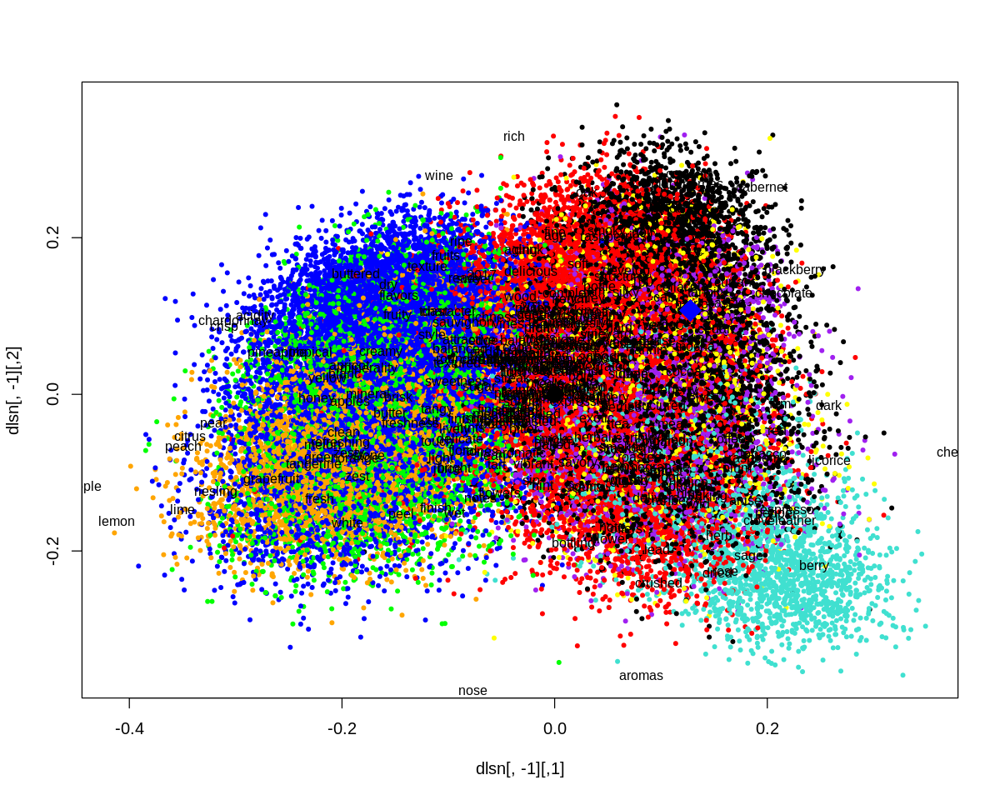

In [ ]:
plot( dlsn[,-1], pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto[,-1], labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(CabernetSauvignonQuery$ls)[2],normrows(CabernetSauvignonQuery$ls)[3],cex=3,pch=18,col="blue")

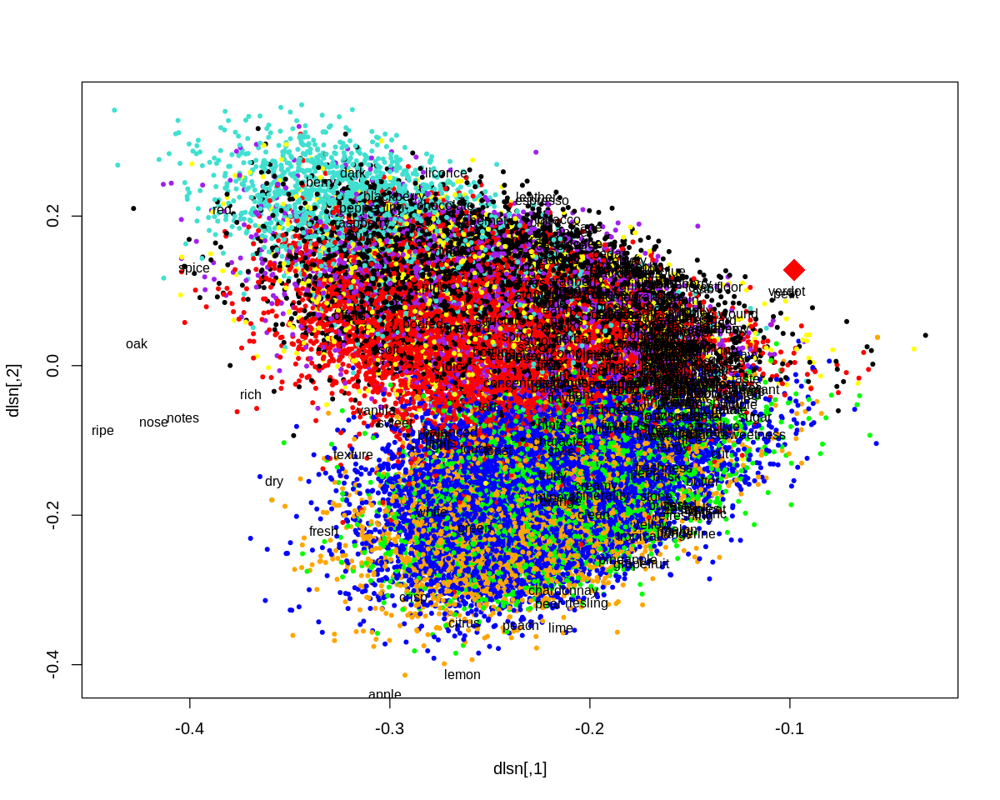

In [ ]:
plot( dlsn, pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto, labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(CabernetSauvignonQuery$ls),cex=3,pch=18,col="red")

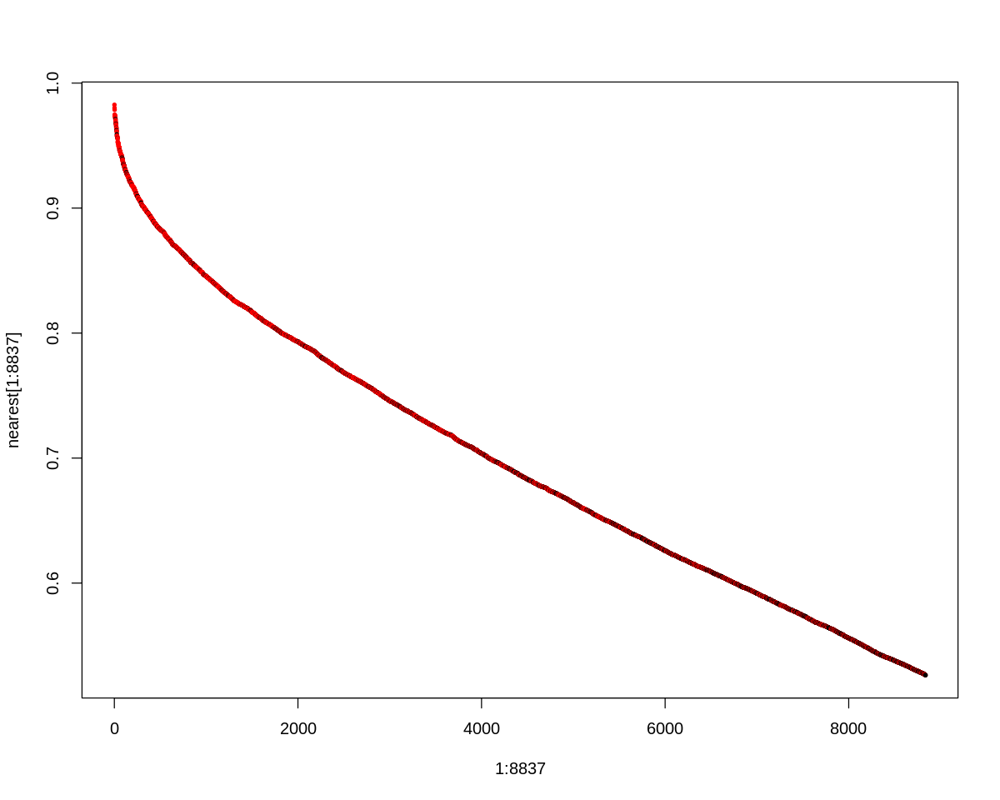

In [ ]:
nearest <- sort( cosines( dls[,1:7], CabernetSauvignonQuery$ls[1:7] ), decreasing=T )

damcols2 <- rep( "black", length(variety) )
damcols2[ variety == "Cabernet Sauvignon" ] <- "red" 

plot( 1:8837, nearest[1:8837], pch=20, cex=0.7, col=damcols2[strtoi(names(nearest))] )

In [ ]:
CabernetSauvignonQuery.vs.CabernetSauvignon <- table(1:nrow(dls) %in% top(cosines(dls[,1:7], CabernetSauvignonQuery$ls[1:7]), 8837), variety=="Cabernet Sauvignon" )
dimnames(CabernetSauvignonQuery.vs.CabernetSauvignon) <- list(CabernetSauvignonQuery = c("No", "Si"), CabernetSauvignon = c("No", "Si"))
CabernetSauvignonQuery.vs.CabernetSauvignon

c = chisq.test( CabernetSauvignonQuery.vs.CabernetSauvignon, correct=FALSE )
c$expected
c$p.value

                      CabernetSauvignon
CabernetSauvignonQuery    No    Si
                    No 39196  3408
                    Si  3408  5429

,No,Si
No,35285.1,7318.9
Si,7318.9,1518.1


[1] 0

### **Analisi Riesling**

In [ ]:
lemon.vs.Riesling <- table( tdm["sweetness",]>0, variety=="Riesling")
dimnames(lemon.vs.Riesling) <- list(lemon = c("No", "Si"), Riesling = c("No", "Si"))
chisqtest = chisq.test( lemon.vs.Riesling, correct=FALSE )
chisqtest
chisqtest$expected
chisqtest$observed


	Pearson's Chi-squared test

data:  lemon.vs.Riesling
X-squared = 638.1, df = 1, p-value < 2.2e-16


,No,Si
No,45937.6927,4698.30734
Si,730.3073,74.69266


     Riesling
lemon    No    Si
   No 46144  4492
   Si   524   281

In [ ]:
RieslingQuery <- makequery( "aromatic sweetness", tdm, lsar )
variety[top(cosines(dls[,1:7],RieslingQuery$ls[1:7]),20)]
#reviews[top(cosines(dls[,1:7],RieslingQuery$ls[1:7]),30)]
sort(table( variety[ top( cosines( dls[,1:7], RieslingQuery$ls[1:7] ), 4773 ) ] ),decreasing =T)

[1] "Riesling"   "Riesling"   "Riesling"   "Riesling"   "Riesling"  
 [6] "Riesling"   "Riesling"   "Chardonnay" "Riesling"   "Riesling"  
[11] "Riesling"   "Riesling"   "Riesling"   "Riesling"   "Riesling"  
[16] "Riesling"   "Riesling"   "Riesling"   "Riesling"   "Riesling"


          Riesling         Chardonnay    Sauvignon Blanc         Pinot Noir 
              3228                730                702                 70 
          Nebbiolo              Syrah             Merlot Cabernet Sauvignon 
                18                 13                  7                  5 

In [ ]:
sort(cosines( tksrs[,1:7], RieslingQuery$dksrs[1:7] ), decreasing = T)[1:10]

perfume  delicately        lend       tones        tone penetrating 
  0.9652222   0.9578135   0.9502502   0.9390103   0.9358417   0.9253840 
      white      whiffs   intensely    riesling 
  0.9232813   0.9216608   0.9109442   0.9104795

In [ ]:
sort(tnorms4[cosines(tksrs[,1:7],RieslingQuery$dksrs[1:7])>0.9],decreasing = T)

riesling       white   tangerine       tones        lend   intensely 
  5.1392500   4.3594730   2.8808475   1.6382244   1.5494150   1.2106757 
  lemonlime        tone      whiffs  delicately penetrating     perfume 
  1.1545334   0.8758301   0.8487722   0.7986122   0.7609837   0.7367737

In [ ]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:7],RieslingQuery$dksrs[1:7])>0.5],decreasing = T))) {
  RieslingQuery <- makequery( paste("aromatic sweetness ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:7], RieslingQuery$ls[1:7] ), 4773 ) ] )["Riesling"]
  if(n>3220) {
    print(paste(newWord,":", n ))
  }
}

[1] "lend : 3221"
[1] "intensely : 3240"
[1] "add : 3234"
[1] "streak : 3246"
[1] "tone : 3222"
[1] "mouthwatering : 3226"
[1] "delicately : 3240"
[1] "deeply : 3238"
[1] "penetrating : 3237"
[1] "perfume : 3240"
[1] "purity : 3229"
[1] "food : 3229"
[1] "start : 3233"
[1] "moderately : 3230"
[1] "drinks : 3229"
[1] "nuanced : 3234"
[1] "dishes : 3222"


In [ ]:
RieslingQuery <- makequery( "aromatic sweetness perfume ", tdm, lsar )
variety[top(cosines(dls[,1:7],RieslingQuery$ls[1:7]),20)]
#reviews[top(cosines(dls[,1:7],RieslingQuery$ls[1:7]),30)]
head(sort(table( variety[ top( cosines( dls[,1:7], RieslingQuery$ls[1:7] ), 4773 ) ] ),decreasing = T))

[1] "Riesling" "Riesling" "Riesling" "Riesling" "Riesling" "Riesling"
 [7] "Riesling" "Riesling" "Riesling" "Riesling" "Riesling" "Riesling"
[13] "Riesling" "Riesling" "Riesling" "Riesling" "Riesling" "Riesling"
[19] "Riesling" "Riesling"


       Riesling Sauvignon Blanc      Chardonnay      Pinot Noir        Nebbiolo 
           3240             786             643              65              13 
          Syrah 
             12 

In [ ]:
sort(cosines( tksrs[,1:7], RieslingQuery$dksrs[1:7] ), decreasing = T)[1:10]

perfume  delicately        lend        tone    riesling penetrating 
  0.9855761   0.9803242   0.9794940   0.9663046   0.9570024   0.9568475 
     whiffs       tones   intensely   tangerine 
  0.9538818   0.9395558   0.9331942   0.9315599

In [ ]:
sort(tnorms4[cosines(tksrs[,1:7],RieslingQuery$dksrs[1:7])>0.95],decreasing = T)

riesling        lend        tone      whiffs  delicately penetrating 
  5.1392500   1.5494150   0.8758301   0.8487722   0.7986122   0.7609837 
    perfume 
  0.7367737

In [ ]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:7],RieslingQuery$dksrs[1:7])>0.5],decreasing = T))) {
  RieslingQuery <- makequery( paste("aromatic sweetness perfume ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:7], RieslingQuery$ls[1:7] ), 4773 ) ] )["Riesling"]
  if(n>3230) {
    print(paste(newWord,":", n ))
  }
}

[1] "lend : 3231"
[1] "aromatic : 3247"
[1] "subtle : 3241"
[1] "intensely : 3235"
[1] "add : 3253"
[1] "finishing : 3233"
[1] "focused : 3232"
[1] "intensity : 3263"
[1] "tone : 3233"
[1] "whiffs : 3234"
[1] "delicately : 3236"
[1] "deeply : 3231"
[1] "stony : 3234"
[1] "penetrating : 3239"
[1] "perfume : 3242"
[1] "improve : 3245"
[1] "purity : 3240"
[1] "start : 3241"
[1] "deliciously : 3242"
[1] "moderately : 3235"
[1] "wonderful : 3233"
[1] "drinks : 3234"
[1] "nuanced : 3245"
[1] "surprisingly : 3238"


In [ ]:
RieslingQuery <- makequery( "aromatic sweetness perfume intensity ", tdm, lsar )
variety[top(cosines(dls[,1:7],RieslingQuery$ls[1:7]),20)]
#reviews[top(cosines(dls[,1:7],RieslingQuery$ls[1:7]),30)]
table( variety[ top( cosines( dls[,1:7], RieslingQuery$ls[1:7] ), 4773 ) ] )["Riesling"]

[1] "Riesling" "Riesling" "Riesling" "Riesling" "Riesling" "Riesling"
 [7] "Riesling" "Riesling" "Riesling" "Riesling" "Riesling" "Riesling"
[13] "Riesling" "Riesling" "Riesling" "Riesling" "Riesling" "Riesling"
[19] "Riesling" "Riesling"

Riesling 
    3263

In [ ]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:7],RieslingQuery$dksrs[1:7])>0.5],decreasing = T))) {
  RieslingQuery <- makequery( paste("aromatic sweetness perfume intensity ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:7], RieslingQuery$ls[1:7] ), 4773 ) ] )["Riesling"]
  if(n>3262) {
    print(paste(newWord,":", n ))
  }
}

[1] "perfume : 3267"
[1] "nuanced : 3263"


In [ ]:
RieslingQuery <- makequery( "aromatic sweetness perfume intensity perfume", tdm, lsar )
variety[top(cosines(dls[,1:7],RieslingQuery$ls[1:7]),20)]
#reviews[top(cosines(dls[,1:7],RieslingQuery$ls[1:7]),30)]
table( variety[ top( cosines( dls[,1:7], RieslingQuery$ls[1:7] ), 4773 ) ] )["Riesling"]

[1] "Riesling" "Riesling" "Riesling" "Riesling" "Riesling" "Riesling"
 [7] "Riesling" "Riesling" "Riesling" "Riesling" "Riesling" "Riesling"
[13] "Riesling" "Riesling" "Riesling" "Riesling" "Riesling" "Riesling"
[19] "Riesling" "Riesling"

Riesling 
    3267

In [ ]:
sort(cosines( tksrs[,1:7], RieslingQuery$dksrs[1:7] ), decreasing = T)[1:20]

perfume        lend penetrating  delicately        tone   intensely 
  0.9890300   0.9854289   0.9702049   0.9687409   0.9679931   0.9617588 
   riesling      whiffs       tones   tangerine   lemonlime      deeply 
  0.9590907   0.9569606   0.9422862   0.9248731   0.9224776   0.8987416 
      zesty     blossom        zest       white       brisk    blossoms 
  0.8940450   0.8851757   0.8798010   0.8621788   0.8569974   0.8481829 
  elegantly        lime 
  0.8340414   0.8309609

In [ ]:
sort(tnorms4[cosines(tksrs[,1:7],RieslingQuery$dksrs[1:7])>0.8],decreasing = T)

riesling        lime       white  grapefruit   tangerine       zesty 
  5.1392500   4.9798257   4.3594730   3.6045658   2.8808475   2.4173468 
      brisk        zest       stone    delicate      floral       tones 
  2.3689435   2.0971508   2.0556477   1.9854131   1.7393292   1.6382244 
       lend     blossom   intensely   lemonlime        tone   elegantly 
  1.5494150   1.5101862   1.2106757   1.1545334   0.8758301   0.8570007 
     whiffs    blossoms  delicately      deeply penetrating      linear 
  0.8487722   0.8426378   0.7986122   0.7868386   0.7609837   0.7497561 
    perfume 
  0.7367737

In [ ]:
table(variety)["Riesling"]/length(variety)

Riesling 
0.09278591

In [ ]:
table( variety[ top( cosines( dls[,1:7], RieslingQuery$ls[1:7] ), 4773 ) ] )["Riesling"]/table(variety)["Riesling"]

Riesling 
0.6844752

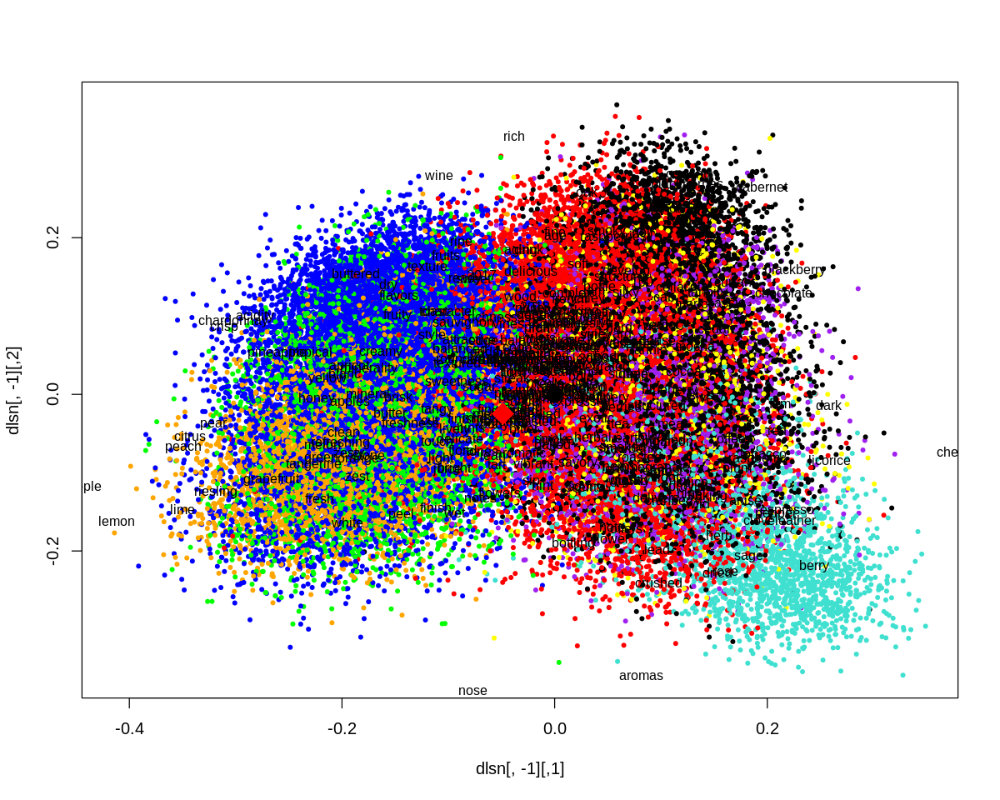

In [ ]:
plot( dlsn[,-1], pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto[,-1], labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(RieslingQuery$ls)[2],normrows(RieslingQuery$ls)[3],cex=3,pch=18,col="red")

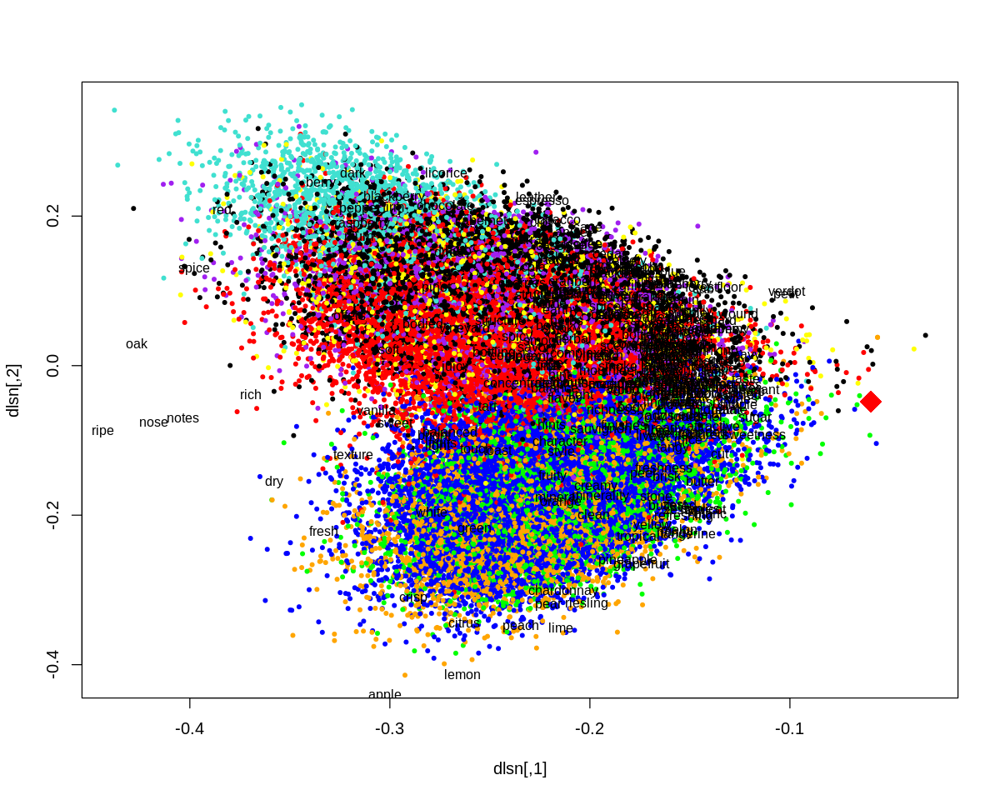

In [ ]:
plot( dlsn, pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto, labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(RieslingQuery$ls),cex=3,pch=18,col="red")

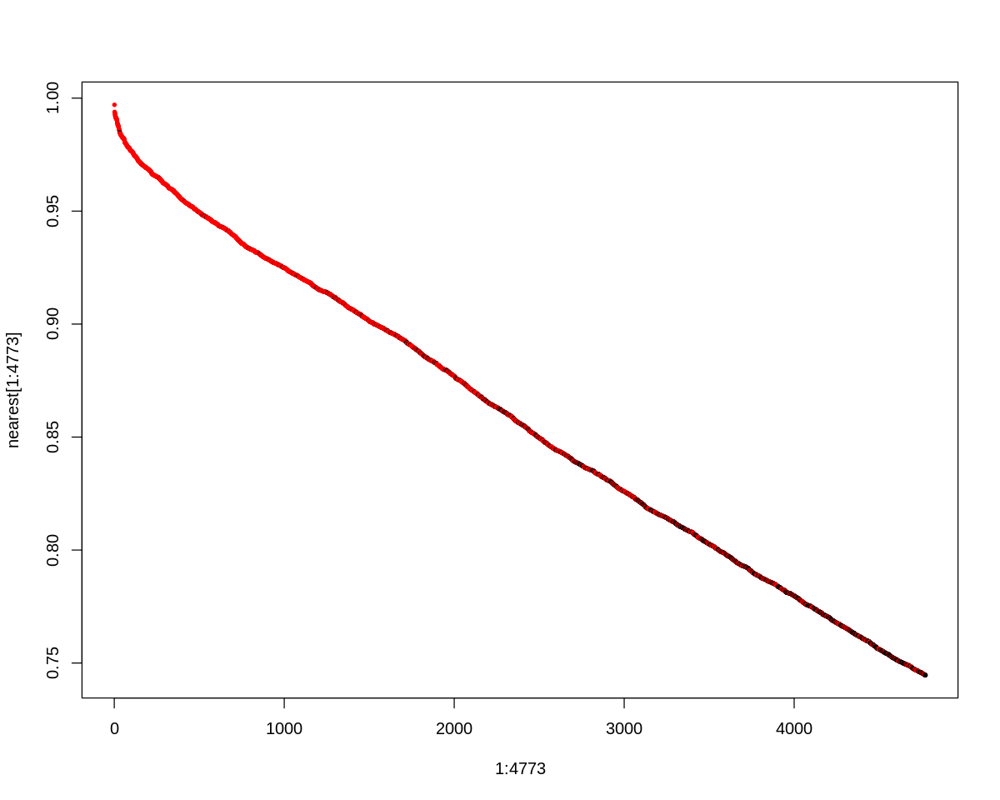

In [ ]:
nearest <- sort( cosines( dls[,1:7], RieslingQuery$ls[1:7] ), decreasing=T )

damcols2 <- rep( "black", length(variety) )
damcols2[ variety == "Riesling" ] <- "red" 

plot( 1:4773, nearest[1:4773], pch=20, cex=0.7, col=damcols2[strtoi(names(nearest))] )

In [ ]:
RieslingQuery.vs.Riesling <- table(1:nrow(dls) %in% top(cosines(dls[,1:7], RieslingQuery$ls[1:7]), 4773), variety=="Riesling" )
dimnames(RieslingQuery.vs.Riesling) <- list(RieslingQuery = c("No", "Si"), Riesling = c("No", "Si"))
RieslingQuery.vs.Riesling

c = chisq.test( RieslingQuery.vs.Riesling, correct=FALSE )
c$expected
c

             Riesling
RieslingQuery    No    Si
           No 45162  1506
           Si  1506  3267

,No,Si
No,42337.867,4330.1329
Si,4330.133,442.8671



	Pearson's Chi-squared test

data:  RieslingQuery.vs.Riesling
X-squared = 21882, df = 1, p-value < 2.2e-16


### **Analisi Sauvignon Blanc**

In [ ]:
head(sort(rowSums(tdm[,variety=="Sauvignon Blanc"]),decreasing = T),20)

wine    flavors    acidity     finish      fruit     citrus      green 
      2893       2624       1489       1425       1365       1301       1266 
    aromas  sauvignon     palate      blanc      crisp      drink grapefruit 
      1221       1219       1143       1102       1036        941        887 
      lime       ripe      fresh      white      lemon      apple 
       857        801        783        751        741        709

In [ ]:
green.vs.SauvignonBlanc <- table( tdm["green",]>0, variety=="Sauvignon Blanc")
dimnames(green.vs.SauvignonBlanc) <- list(green = c("No", "Si"), SauvignonBlanc = c("No", "Si"))
chisqtest = chisq.test( green.vs.SauvignonBlanc, correct=FALSE )
chisqtest
chisqtest$expected
chisqtest$observed


	Pearson's Chi-squared test

data:  green.vs.SauvignonBlanc
X-squared = 2033.7, df = 1, p-value < 2.2e-16


,No,Si
No,43446.796,4240.2041
Si,3420.204,333.7959


     SauvignonBlanc
green    No    Si
   No 44204  3483
   Si  2663  1091

In [ ]:
SauvignonBlancQuery <- makequery( "green", tdm, lsar )
variety[top(cosines(dls[,1:7],SauvignonBlancQuery$ls[1:7]),20)]
#reviews[top(cosines(dls[,1:7],SauvignonBlancQuery$ls[1:7]),30)]
table( variety[ top( cosines( dls[,1:7], SauvignonBlancQuery$ls[1:7] ), 4574 ) ] )["Sauvignon Blanc"]

[1] "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc"
 [5] "Sauvignon Blanc" "Merlot"          "Sauvignon Blanc" "Sauvignon Blanc"
 [9] "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc"
[13] "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc"
[17] "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc"

Sauvignon Blanc 
           1932

In [ ]:
sort(cosines( tksrs[,1:7], SauvignonBlancQuery$dksrs[1:7] ), decreasing = T)[1:10]

grassy      green    pungent    passion      skins      briny bitterness 
 0.9807990  0.9522699  0.9407543  0.9385704  0.8990691  0.8946611  0.8930134 
     grass      salty     chalky 
 0.8913302  0.8898773  0.8676705

In [ ]:
sort(tnorms4[cosines(tksrs[,1:7],SauvignonBlancQuery$dksrs[1:7])>0.8],decreasing = T)

green      touch        wet      juice      grass     bitter       skin 
 4.3362360  3.2651906  1.5195570  1.2040505  1.1375853  1.0796573  0.9464823 
    chalky        sea       salt    passion     grassy      salty      flesh 
 0.9170464  0.8883402  0.8846038  0.8324710  0.8078742  0.7806520  0.7680505 
      bell      skins      briny     slight       acid    lasting    pungent 
 0.7356913  0.7331011  0.7118085  0.6985371  0.6778271  0.5927493  0.5277933 
bitterness 
 0.5133977

In [ ]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:7],SauvignonBlancQuery$dksrs[1:7])>0.5],decreasing = T))) {
  SauvignonBlancQuery <- makequery( paste("green ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:7], SauvignonBlancQuery$ls[1:7] ), 4574 ) ] )["Sauvignon Blanc"]
  if(n>2010) {
    print(paste(newWord,":", n ))
  }
}

[1] "blanc : 2039"
[1] "pure : 2083"
[1] "streak : 2012"
[1] "herbaceous : 2017"


In [ ]:
SauvignonBlancQuery <- makequery( "green pure herbaceous", tdm, lsar )
variety[top(cosines(dls[,1:7],SauvignonBlancQuery$ls[1:7]),10)]
#reviews[top(cosines(dls[,1:7],SauvignonBlancQuery$ls[1:7]),30)]
table( variety[ top( cosines( dls[,1:7], SauvignonBlancQuery$ls[1:7] ), 4574 ) ] )["Sauvignon Blanc"]

[1] "Sauvignon Blanc" "Sauvignon Blanc" "Merlot"          "Sauvignon Blanc"
 [5] "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc"
 [9] "Sauvignon Blanc" "Sauvignon Blanc"

Sauvignon Blanc 
           2108

In [ ]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:7],SauvignonBlancQuery$dksrs[1:7])>0.5],decreasing = T))) {
  SauvignonBlancQuery <- makequery( paste("green pure herbaceous ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:7], SauvignonBlancQuery$ls[1:7] ), 4574 ) ] )["Sauvignon Blanc"]
  if(n>2100) {
    print(paste(newWord,":", n ))
  }
}

[1] "pure : 2117"
[1] "ripeness : 2117"
[1] "streak : 2104"
[1] "tang : 2102"
[1] "herbaceous : 2113"
[1] "food : 2101"
[1] "riper : 2105"
[1] "start : 2101"
[1] "typical : 2105"
[1] "streaks : 2101"


In [ ]:
SauvignonBlancQuery <- makequery( "green pure herbaceous ripeness", tdm, lsar )
variety[top(cosines(dls[,1:7],SauvignonBlancQuery$ls[1:7]),10)]
#reviews[top(cosines(dls[,1:7],SauvignonBlancQuery$ls[1:7]),30)]
table( variety[ top( cosines( dls[,1:7], SauvignonBlancQuery$ls[1:7] ), 4574 ) ] )["Sauvignon Blanc"]

[1] "Sauvignon Blanc" "Sauvignon Blanc" "Merlot"          "Sauvignon Blanc"
 [5] "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc"
 [9] "Sauvignon Blanc" "Sauvignon Blanc"

Sauvignon Blanc 
           2117

In [ ]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:7],SauvignonBlancQuery$dksrs[1:7])>0.5],decreasing = T))) {
  SauvignonBlancQuery <- makequery( paste("green pure herbaceous ripeness ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:7], SauvignonBlancQuery$ls[1:7] ), 4574 ) ] )["Sauvignon Blanc"]
  if(n>2115) {
    print(paste(newWord,":", n ))
  }
}

[1] "blanc : 2128"
[1] "steel : 2126"
[1] "— : 2117"


In [ ]:
SauvignonBlancQuery <- makequery( "green pure herbaceous ripeness blanc", tdm, lsar )
variety[top(cosines(dls[,1:7],SauvignonBlancQuery$ls[1:7]),10)]
#reviews[top(cosines(dls[,1:7],SauvignonBlancQuery$ls[1:7]),30)]
table( variety[ top( cosines( dls[,1:7], SauvignonBlancQuery$ls[1:7] ), 4574 ) ] )["Sauvignon Blanc"]

[1] "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc"
 [5] "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc"
 [9] "Sauvignon Blanc" "Sauvignon Blanc"

Sauvignon Blanc 
           2128

In [ ]:
sort(cosines( tksrs[,1:7], SauvignonBlancQuery$dksrs[1:7] ), decreasing = T)[1:20]

grassy gooseberry      green      blanc      riper    passion herbaceous 
 0.9146712  0.9135432  0.8937382  0.8900898  0.8834313  0.8828974  0.8526240 
    chalky        cut      grass       tang    pungent      skins     purity 
 0.8417452  0.8405526  0.8351464  0.8342406  0.8273407  0.8146282  0.8030615 
    citrus grapefruit       skin     lemony       pink      stony 
 0.7948397  0.7840364  0.7720610  0.7697488  0.7687259  0.7652431

In [ ]:
sort(tnorms4[cosines(tksrs[,1:7],SauvignonBlancQuery$dksrs[1:7])>0.8],decreasing = T)

green      blanc        cut      grass gooseberry     chalky    passion 
 4.3362360  2.1838816  1.2737547  1.1375853  0.9271094  0.9170464  0.8324710 
    grassy      skins     purity       tang herbaceous      riper    pungent 
 0.8078742  0.7331011  0.5953889  0.5926868  0.5895879  0.5702460  0.5277933

In [ ]:
table(variety)["Sauvignon Blanc"]/length(variety)

Sauvignon Blanc 
      0.0889174

In [ ]:
table( variety[ top( cosines( dls[,1:7], SauvignonBlancQuery$ls[1:7] ), 4574 ) ] )["Sauvignon Blanc"]/table(variety)["Sauvignon Blanc"]

Sauvignon Blanc 
      0.4652383

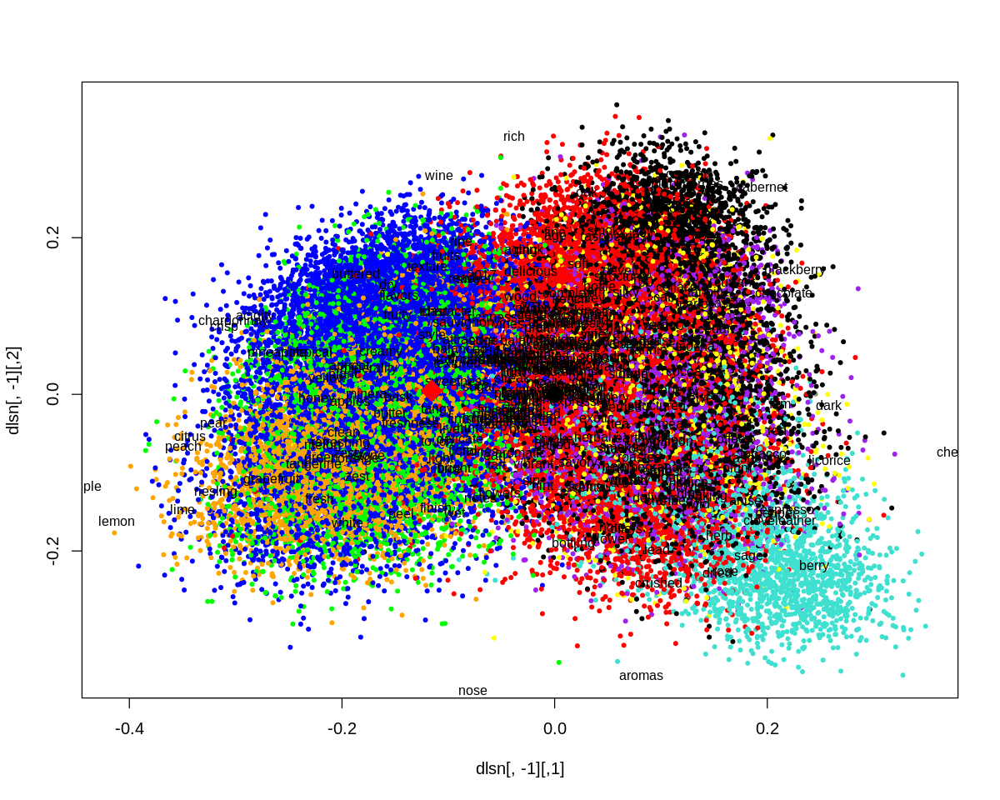

In [ ]:
plot( dlsn[,-1], pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto[,-1], labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(SauvignonBlancQuery$ls)[2],normrows(SauvignonBlancQuery$ls)[3],cex=3,pch=18,col="red")

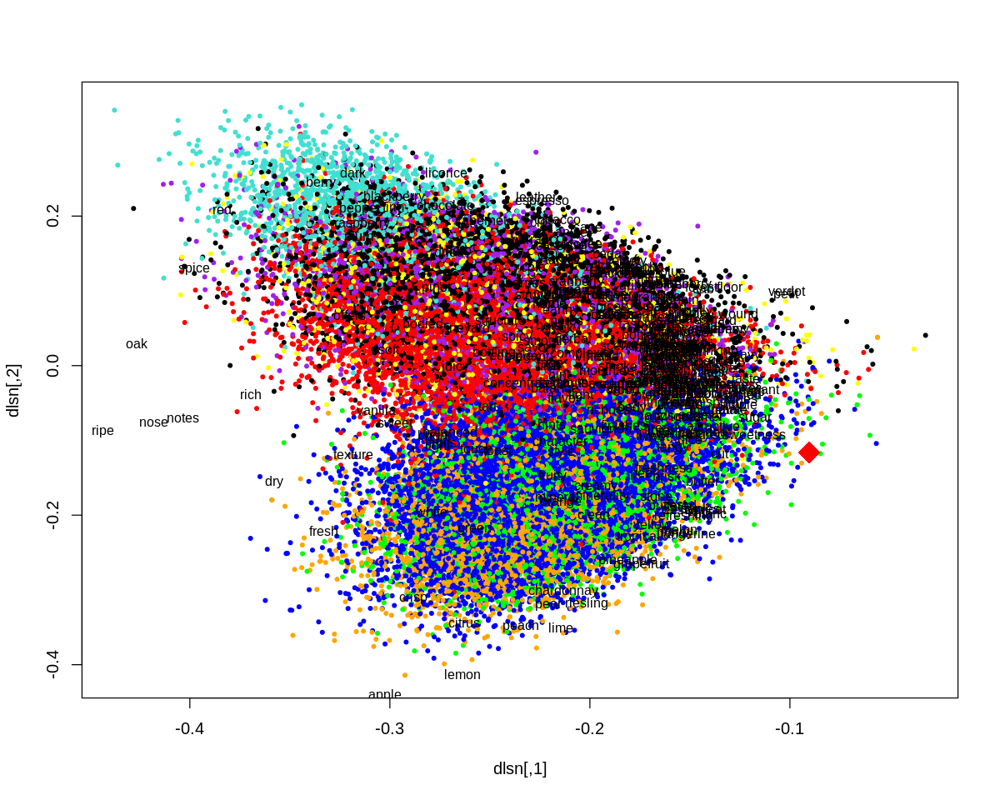

In [ ]:
plot( dlsn, pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto, labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(SauvignonBlancQuery$ls),cex=3,pch=18,col="red")

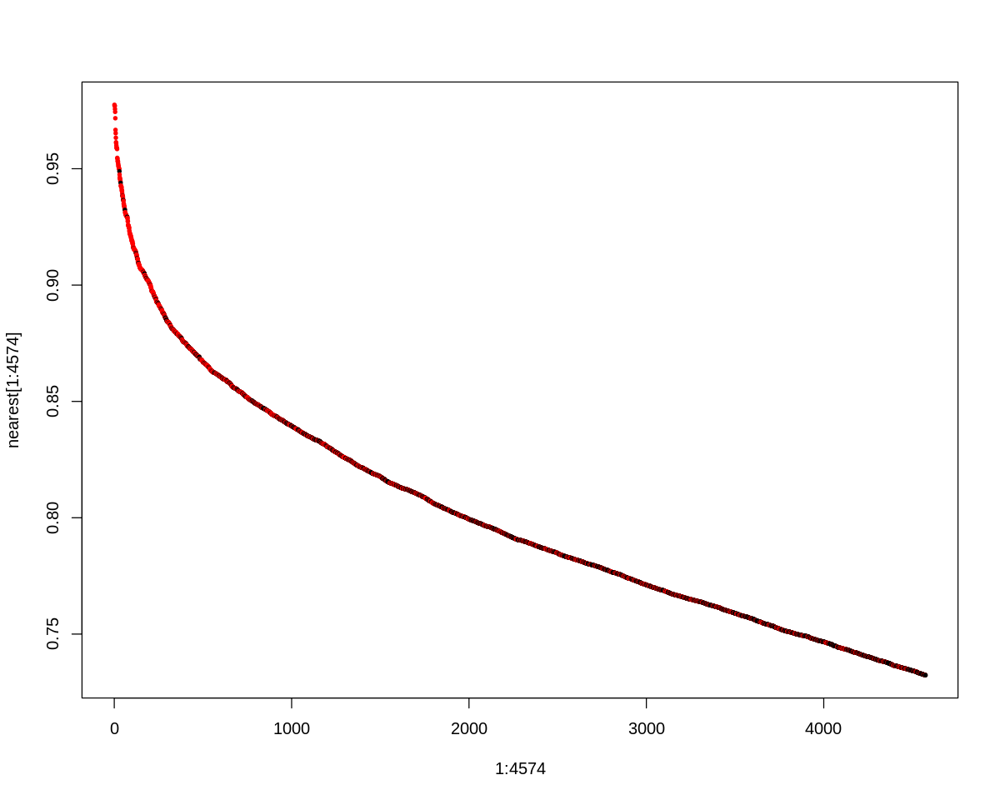

In [ ]:
nearest <- sort( cosines( dls[,1:7], SauvignonBlancQuery$ls[1:7] ), decreasing=T )

damcols2 <- rep( "black", length(variety) )
damcols2[ variety == "Sauvignon Blanc" ] <- "red" 

plot( 1:4574, nearest[1:4574], pch=20, cex=0.7, col=damcols2[strtoi(names(nearest))] )

In [ ]:
SauvignonBlancQuery.vs.SauvignonBlanc <- table(1:nrow(dls) %in% top(cosines(dls[,1:7], SauvignonBlancQuery$ls[1:7]), 4574), variety=="Sauvignon Blanc" )
dimnames(SauvignonBlancQuery.vs.SauvignonBlanc) <- list(SauvignonBlancQuery = c("No", "Si"), SauvignonBlanc = c("No", "Si"))
SauvignonBlancQuery.vs.SauvignonBlanc

c = chisq.test( SauvignonBlancQuery.vs.SauvignonBlanc, correct=FALSE )
c$expected
c$p.value

                   SauvignonBlanc
SauvignonBlancQuery    No    Si
                 No 44421  2446
                 Si  2446  2128

,No,Si
No,42699.708,4167.2918
Si,4167.292,406.7082


[1] 0

### **Analisi Syrah**

In [ ]:
chocolate.vs.Syrah <- table( tdm["chewy",]>0, variety=="Syrah")
dimnames(chocolate.vs.Syrah) <- list(chocolate = c("No", "Si"), Syrah = c("No", "Si"))
chisqtest = chisq.test( chocolate.vs.Syrah, correct=FALSE )
chisqtest
chisqtest$expected
chisqtest$observed


	Pearson's Chi-squared test

data:  chocolate.vs.Syrah
X-squared = 49.398, df = 1, p-value = 2.09e-12


,No,Si
No,46318.892,4566.10797
Si,506.108,49.89203


         Syrah
chocolate    No    Si
       No 46366  4519
       Si   459    97

In [ ]:
SyrahQuery <- makequery( "chewy smoke", tdm, lsar )
variety[top(cosines(dls[,1:7],SyrahQuery$ls[1:7]),20)]
#reviews[top(cosines(dls[,1:7],SyrahQuery$ls[1:7]),30)]
table( variety[ top( cosines( dls[,1:7], SyrahQuery$ls[1:7] ), 4616 ) ] )["Syrah"]

[1] "Syrah"              "Syrah"              "Cabernet Sauvignon"
 [4] "Cabernet Sauvignon" "Cabernet Sauvignon" "Merlot"            
 [7] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
[10] "Syrah"              "Syrah"              "Cabernet Sauvignon"
[13] "Cabernet Sauvignon" "Cabernet Sauvignon" "Syrah"             
[16] "Syrah"              "Merlot"             "Syrah"             
[19] "Cabernet Sauvignon" "Cabernet Sauvignon"

Syrah 
 1335

In [ ]:
sort(cosines( tksrs[,1:7], SyrahQuery$dksrs[1:7] ), decreasing = T)[1:10]

meat       tar     smoke     black blueberry  brooding    pepper    smoked 
0.9193817 0.8960340 0.8626676 0.8535060 0.8531256 0.8528330 0.8479839 0.8376531 
    olive      beef 
0.8135353 0.8124690

In [ ]:
sort(tnorms4[cosines(tksrs[,1:7],SyrahQuery$dksrs[1:7])>0.8],decreasing = T)

black       pepper       savory        herbs        smoke    blueberry 
   7.9098121    4.3894026    2.5574296    2.5126811    1.8665015    1.8124885 
       olive         meat         beef       smoked          tar approachable 
   1.6986661    1.6083798    1.1398129    1.0906715    1.0745862    0.8363125 
     violets      charred     brooding        prune 
   0.8119244    0.7942209    0.7266786    0.6723103

In [ ]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:7],SyrahQuery$dksrs[1:7])>0.6],decreasing = T))) {
  SyrahQuery <- makequery( paste("chewy smoke ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:7], SyrahQuery$ls[1:7] ), 4616 ) ] )["Syrah"]
  if(n>1330) {
    print(paste(newWord,":", n ))
  }
}

[1] "smoke : 1335"
[1] "expression : 1357"
[1] "approachable : 1341"
[1] "violets : 1337"
[1] "grippy : 1336"
[1] "inviting : 1331"
[1] "toned : 1331"
[1] "play : 1352"
[1] "subdued : 1331"
[1] "start : 1343"
[1] "reveals : 1359"
[1] "streaks : 1336"
[1] "extremely : 1344"
[1] "leading : 1332"
[1] "displays : 1331"


In [ ]:
SyrahQuery <- makequery( "chewy smoke expression ", tdm, lsar )
variety[top(cosines(dls[,1:7],SyrahQuery$ls[1:7]),20)]
#reviews[top(cosines(dls[,1:7],SyrahQuery$ls[1:7]),30)]
table( variety[ top( cosines( dls[,1:7], SyrahQuery$ls[1:7] ), 4616 ) ] )["Syrah"]

[1] "Cabernet Sauvignon" "Cabernet Sauvignon" "Syrah"             
 [4] "Syrah"              "Cabernet Sauvignon" "Syrah"             
 [7] "Syrah"              "Cabernet Sauvignon" "Syrah"             
[10] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
[13] "Syrah"              "Cabernet Sauvignon" "Cabernet Sauvignon"
[16] "Syrah"              "Merlot"             "Syrah"             
[19] "Syrah"              "Syrah"

Syrah 
 1357

In [ ]:
sort(cosines( tksrs[,1:7], SyrahQuery$dksrs[1:7] ), decreasing = T)[1:10]

meat       tar     smoke    smoked     herbs    grippy  brooding    pepper 
0.9473756 0.9286959 0.9114761 0.9070879 0.8915953 0.8869006 0.8704321 0.8693858 
blueberry   violets 
0.8689341 0.8664646

In [ ]:
sort(tnorms4[cosines(tksrs[,1:7],SyrahQuery$dksrs[1:7])>0.8],decreasing = T)

black         dark       pepper       savory        herbs        smoke 
   7.9098121    4.7959577    4.3894026    2.5574296    2.5126811    1.8665015 
   blueberry        olive         deep         meat     graphite         beef 
   1.8124885    1.6986661    1.6213113    1.6083798    1.2368983    1.1398129 
      smoked          tar  boysenberry       pencil         grip approachable 
   1.0906715    1.0745862    1.0599472    1.0344392    0.8746046    0.8363125 
     violets      charred     leathery         bell     brooding       grippy 
   0.8119244    0.7942209    0.7474379    0.7356913    0.7266786    0.7103425 
       toned         play    extremely       gritty      lengthy 
   0.5980887    0.5499992    0.5153490    0.5003295    0.4867480

In [ ]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:7],SyrahQuery$dksrs[1:7])>0.6],decreasing = T))) {
  SyrahQuery <- makequery( paste("chewy smoke expression ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:7], SyrahQuery$ls[1:7] ), 4616 ) ] )["Syrah"]
  if(n>1385) {
    print(paste(newWord,":", n ))
  }
}

[1] "finishing : 1398"
[1] "focused : 1386"
[1] "play : 1387"
[1] "tension : 1396"
[1] "moderately : 1391"
[1] "leaves : 1394"
[1] "focus : 1396"


In [ ]:
SyrahQuery <- makequery( "chewy smoke expression finishing", tdm, lsar )
variety[top(cosines(dls[,1:7],SyrahQuery$ls[1:7]),20)]
#reviews[top(cosines(dls[,1:7],SyrahQuery$ls[1:7]),30)]
table( variety[ top( cosines( dls[,1:7], SyrahQuery$ls[1:7] ), 4616 ) ] )["Syrah"]

[1] "Cabernet Sauvignon" "Syrah"              "Syrah"             
 [4] "Syrah"              "Syrah"              "Syrah"             
 [7] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
[10] "Cabernet Sauvignon" "Cabernet Sauvignon" "Syrah"             
[13] "Syrah"              "Merlot"             "Cabernet Sauvignon"
[16] "Syrah"              "Cabernet Sauvignon" "Syrah"             
[19] "Syrah"              "Cabernet Sauvignon"

Syrah 
 1398

In [ ]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:7],SyrahQuery$dksrs[1:7])>0.6],decreasing = T))) {
  SyrahQuery <- makequery( paste("chewy smoke expression finishing ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:7], SyrahQuery$ls[1:7] ), 4616 ) ] )["Syrah"]
  if(n>1395) {
    print(paste(newWord,":", n ))
  }
}

[1] "depth : 1410"
[1] "layered : 1399"
[1] "expression : 1414"
[1] "approachable : 1403"
[1] "drying : 1400"
[1] "loaded : 1397"
[1] "offer : 1404"
[1] "warmth : 1401"
[1] "enjoyable : 1401"


In [ ]:
SyrahQuery <- makequery( "chewy smoke expression finishing depth", tdm, lsar )
variety[top(cosines(dls[,1:7],SyrahQuery$ls[1:7]),20)]
#reviews[top(cosines(dls[,1:7],SyrahQuery$ls[1:7]),30)]
table( variety[ top( cosines( dls[,1:7], SyrahQuery$ls[1:7] ), 4616 ) ] )["Syrah"]

[1] "Syrah"              "Cabernet Sauvignon" "Cabernet Sauvignon"
 [4] "Cabernet Sauvignon" "Syrah"              "Syrah"             
 [7] "Cabernet Sauvignon" "Syrah"              "Syrah"             
[10] "Cabernet Sauvignon" "Syrah"              "Syrah"             
[13] "Cabernet Sauvignon" "Cabernet Sauvignon" "Pinot Noir"        
[16] "Syrah"              "Merlot"             "Merlot"            
[19] "Cabernet Sauvignon" "Cabernet Sauvignon"

Syrah 
 1410

In [ ]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:7],SyrahQuery$dksrs[1:7])>0.6],decreasing = T))) {
  SyrahQuery <- makequery( paste("chewy smoke expression finishing depth ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:7], SyrahQuery$ls[1:7] ), 4616 ) ] )["Syrah"]
  if(n>1405) {
    print(paste(newWord,":", n ))
  }
}

[1] "sense : 1406"
[1] "approachable : 1409"
[1] "fig : 1415"
[1] "drying : 1406"
[1] "loaded : 1408"
[1] "adding : 1423"
[1] "lengthy : 1412"
[1] "offer : 1409"
[1] "warmth : 1421"
[1] "providing : 1410"
[1] "takes : 1407"
[1] "— : 1410"


In [ ]:
SyrahQuery <- makequery( "chewy smoke expression finishing depth fig", tdm, lsar )
variety[top(cosines(dls[,1:7],SyrahQuery$ls[1:7]),20)]
#reviews[top(cosines(dls[,1:7],SyrahQuery$ls[1:7]),30)]
table( variety[ top( cosines( dls[,1:7], SyrahQuery$ls[1:7] ), 4616 ) ] )["Syrah"]

[1] "Syrah"              "Syrah"              "Syrah"             
 [4] "Cabernet Sauvignon" "Syrah"              "Cabernet Sauvignon"
 [7] "Syrah"              "Merlot"             "Syrah"             
[10] "Cabernet Sauvignon" "Syrah"              "Cabernet Sauvignon"
[13] "Syrah"              "Syrah"              "Merlot"            
[16] "Pinot Noir"         "Cabernet Sauvignon" "Cabernet Sauvignon"
[19] "Syrah"              "Cabernet Sauvignon"

Syrah 
 1415

In [ ]:
sort(cosines( tksrs[,1:7], SyrahQuery$dksrs[1:7] ), decreasing = T)[1:10]

smoke        herbs       grippy       smoked         meat         play 
   0.9329853    0.9126829    0.9115668    0.9092548    0.9086689    0.9056641 
       toned          tar approachable   restrained 
   0.8927310    0.8901370    0.8775563    0.8747611

In [ ]:
sort(tnorms4[cosines(tksrs[,1:7],SyrahQuery$dksrs[1:7])>0.80],decreasing = T)

finish        notes       pepper       savory        herbs        smoke 
   5.9370672    5.1537537    4.3894026    2.5574296    2.5126811    1.8665015 
   blueberry        olive         deep         meat     graphite      layered 
   1.8124885    1.6986661    1.6213113    1.6083798    1.2368983    1.2034285 
        beef       smoked       bitter          tar  boysenberry       pencil 
   1.1398129    1.0906715    1.0796573    1.0745862    1.0599472    1.0344392 
    elements      bouquet    finishing    winemaker       chalky         grip 
   1.0336674    1.0231541    0.9988979    0.9942190    0.9170464    0.8746046 
approachable      violets      charred   restrained     leathery         bell 
   0.8363125    0.8119244    0.7942209    0.7682798    0.7474379    0.7356913 
    brooding       linger       grippy     inviting       starts      profile 
   0.7266786    0.7161171    0.7103425    0.6620827    0.6586865    0.6191452 
       frame        toned      lasting        leads         play        start 
   0.6046665    0.5980887    0.5927493    0.5518134    0.5499992    0.5387821 
     streaks    extremely       gritty      leading      lengthy        takes 
   0.5168718    0.5153490    0.5003295    0.4986675    0.4867480    0.4306523 
       edges 
   0.4080758

In [ ]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:7],SyrahQuery$dksrs[1:7])>0.6],decreasing = T))) {
  SyrahQuery <- makequery( paste("chewy smoke expression finishing depth fig ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:7], SyrahQuery$ls[1:7] ), 4616 ) ] )["Syrah"]
  if(n>1414) {
    print(paste(newWord,":", n ))
  }
}

[1] "layered : 1419"
[1] "expression : 1415"
[1] "offer : 1424"
[1] "displays : 1416"
[1] "built : 1415"
[1] "form : 1416"
[1] "— : 1415"


In [ ]:
SyrahQuery <- makequery( "chewy smoke expression finishing depth fig layered", tdm, lsar )
variety[top(cosines(dls[,1:7],SyrahQuery$ls[1:7]),20)]
#reviews[top(cosines(dls[,1:7],SyrahQuery$ls[1:7]),20)]
table( variety[ top( cosines( dls[,1:7], SyrahQuery$ls[1:7] ), 4616 ) ] )["Syrah"]

[1] "Cabernet Sauvignon" "Cabernet Sauvignon" "Merlot"            
 [4] "Pinot Noir"         "Syrah"              "Syrah"             
 [7] "Syrah"              "Cabernet Sauvignon" "Syrah"             
[10] "Syrah"              "Cabernet Sauvignon" "Cabernet Sauvignon"
[13] "Syrah"              "Syrah"              "Syrah"             
[16] "Syrah"              "Syrah"              "Cabernet Sauvignon"
[19] "Syrah"              "Cabernet Sauvignon"

Syrah 
 1419

In [ ]:
sort(cosines( tksrs[,1:7], SyrahQuery$dksrs[1:7] ), decreasing = T)[1:10]

meat    grippy   lengthy      play       tar    smoked     herbs     olive 
0.9201657 0.9182092 0.9120825 0.9086900 0.9083674 0.9065920 0.9052047 0.8930020 
    smoke    gritty 
0.8925814 0.8831187

In [ ]:
sort(tnorms4[cosines(tksrs[,1:7],SyrahQuery$dksrs[1:7])>0.9],decreasing = T)

herbs      meat    smoked       tar    grippy      play   lengthy 
2.5126811 1.6083798 1.0906715 1.0745862 0.7103425 0.5499992 0.4867480

In [ ]:
table(variety)["Syrah"]/length(variety)

Syrah 
0.08973387

In [ ]:
table( variety[ top( cosines( dls[,1:7], SyrahQuery$ls[1:7] ), 4616 ) ] )["Syrah"]/table(variety)["Syrah"]

Syrah 
0.307409

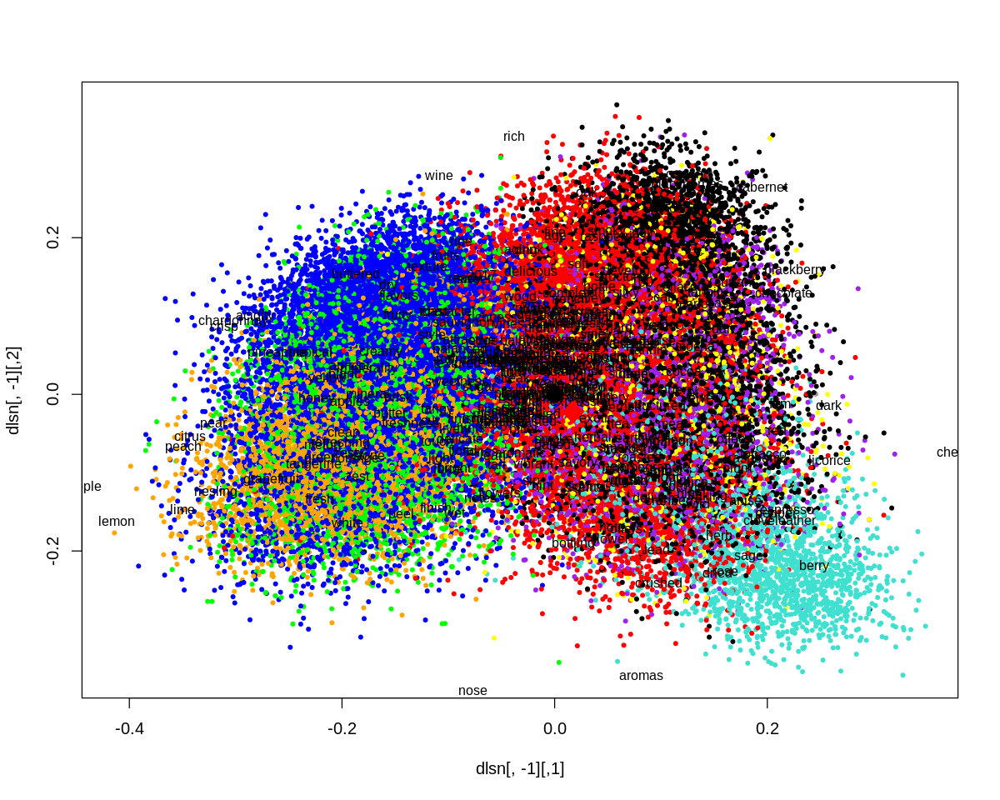

In [ ]:
plot( dlsn[,-1], pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto[,-1], labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(SyrahQuery$ls)[2],normrows(SyrahQuery$ls)[3],cex=3,pch=18,col="red")

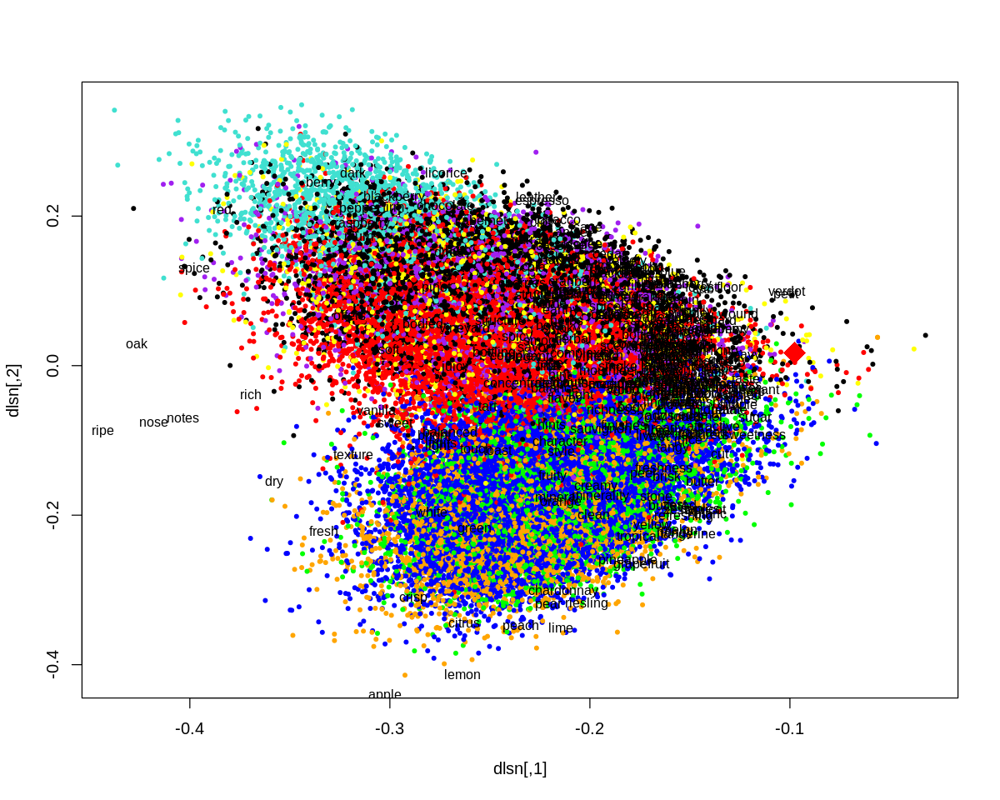

In [ ]:
plot( dlsn, pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto, labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(SyrahQuery$ls),cex=3,pch=18,col="red")

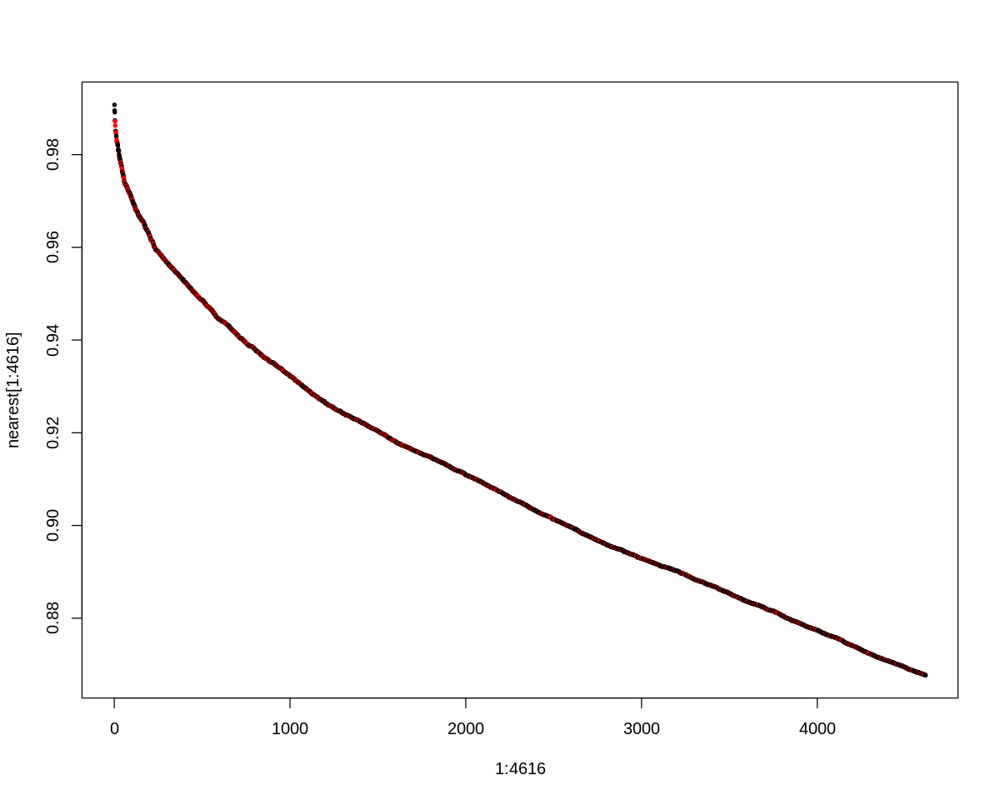

In [ ]:
nearest <- sort( cosines( dls[,1:7], SyrahQuery$ls[1:7] ), decreasing=T )

damcols2 <- rep( "black", length(variety) )
damcols2[ variety == "Syrah" ] <- "red" 

plot( 1:4616, nearest[1:4616], pch=20, cex=0.7, col=damcols2[strtoi(names(nearest))] )

In [ ]:
SyrahQuery.vs.Syrah <- table(1:nrow(dls) %in% top(cosines(dls[,1:7], SyrahQuery$ls[1:7]), 4616), variety=="Syrah" )
dimnames(SyrahQuery.vs.Syrah) <- list(SyrahQuery = c("No", "Si"), Syrah = c("No", "Si"))
SyrahQuery.vs.Syrah

c = chisq.test( SyrahQuery.vs.Syrah, correct=FALSE )
c$expected
c$p.value

          Syrah
SyrahQuery    No    Si
        No 43628  3197
        Si  3197  1419

,No,Si
No,42623.212,4201.7885
Si,4201.788,414.2115


[1] 0

### **Analisi Merlot**

In [ ]:
head(sort(rowSums(tdm[,variety=="Merlot"]),decreasing = T),20)

flavors       wine     merlot      fruit     cherry    tannins     finish 
      1751       1463       1207       1131       1100       1023        814 
    aromas      black        red     palate       plum        oak       soft 
       780        751        647        618        609        584        487 
      ripe        dry      spice      notes      drink blackberry 
       449        448        442        433        408        406

In [ ]:
cocoa.vs.Merlot <- table( tdm["cocoa",]>0, variety=="Merlot")
dimnames(cocoa.vs.Merlot) <- list(cocoa = c("No", "Si"), Merlot = c("No", "Si"))
chisqtest = chisq.test( cocoa.vs.Merlot, correct=FALSE )
chisqtest
chisqtest$expected
chisqtest$observed


	Pearson's Chi-squared test

data:  plum.vs.Merlot
X-squared = 151.43, df = 1, p-value < 2.2e-16


,No,Si
No,47875.9574,2855.04257
Si,670.0426,39.95743


    Merlot
plum    No    Si
  No 47951  2780
  Si   595   115

In [ ]:
MerlotQuery <- makequery( "cocoa", tdm, lsar )
variety[top(cosines(dls[,1:7],MerlotQuery$ls[1:7]),20)]
#reviews[top(cosines(dls[,1:7],MerlotQuery$ls[1:7]),30)]
table( variety[ top( cosines( dls[,1:7], MerlotQuery$ls[1:7] ), 2895 ) ] )["Merlot"]

[1] "Merlot"             "Merlot"             "Pinot Noir"        
 [4] "Syrah"              "Cabernet Sauvignon" "Merlot"            
 [7] "Merlot"             "Cabernet Sauvignon" "Syrah"             
[10] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
[13] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
[16] "Cabernet Sauvignon" "Syrah"              "Cabernet Sauvignon"
[19] "Syrah"              "Cabernet Sauvignon"

Merlot 
   480

In [ ]:
sort(cosines( tksrs[,1:7], MerlotQuery$dksrs[1:7] ), decreasing = T)[1:10]

cocoa      milk      heat      char       hot    shiraz   charred chocolate 
0.9476053 0.9395057 0.9163986 0.8857929 0.8643649 0.8489921 0.8418669 0.8344342 
extracted     sauce 
0.8317290 0.8249094

In [ ]:
sort(tnorms4[cosines(tksrs[,1:7],MerlotQuery$dksrs[1:7])>0.8],decreasing = T)

chocolate    coffee blueberry     cocoa      milk   charred     meaty      heat 
4.4532941 2.7132349 1.8124885 1.2125317 0.7987837 0.7942209 0.7769877 0.6678133 
     char    shiraz       hot extracted     sauce    gritty 
0.6576736 0.6295476 0.6158782 0.5935016 0.5894100 0.5003295

In [ ]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:7],MerlotQuery$dksrs[1:7])>0.6],decreasing = T))) {
  MerlotQuery <- makequery( paste("cocoa ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:7], MerlotQuery$ls[1:7] ), 2895 ) ] )["Merlot"]
  if(n>480) {
    print(paste(newWord,":", n ))
  }
}

[1] "supple : 481"
[1] "quality : 482"
[1] "accents : 483"
[1] "winemaker : 485"
[1] "lot : 496"
[1] "variety : 481"
[1] "tasty : 483"
[1] "lacks : 486"
[1] "reserve : 483"
[1] "hot : 481"
[1] "pleasing : 482"
[1] "frame : 490"
[1] "moderate : 484"
[1] "mellow : 481"
[1] "sauce : 484"
[1] "blackcherry : 487"
[1] "flavorful : 496"
[1] "level : 484"
[1] "tasting : 493"
[1] "providing : 490"
[1] "form : 486"


In [ ]:
MerlotQuery <- makequery( "cocoa flavorful ", tdm, lsar )
variety[top(cosines(dls[,1:7],MerlotQuery$ls[1:7]),20)]
#reviews[top(cosines(dls[,1:7],MerlotQuery$ls[1:7]),30)]
table( variety[ top( cosines( dls[,1:7], MerlotQuery$ls[1:7] ), 2895 ) ] )["Merlot"]

[1] "Pinot Noir"         "Merlot"             "Pinot Noir"        
 [4] "Merlot"             "Merlot"             "Cabernet Sauvignon"
 [7] "Syrah"              "Syrah"              "Pinot Noir"        
[10] "Syrah"              "Cabernet Sauvignon" "Cabernet Sauvignon"
[13] "Merlot"             "Merlot"             "Cabernet Sauvignon"
[16] "Cabernet Sauvignon" "Merlot"             "Syrah"             
[19] "Merlot"             "Syrah"

Merlot 
   496

In [ ]:
sort(cosines( tksrs[,1:7], MerlotQuery$dksrs[1:7] ), decreasing = T)[1:10]

milk     cocoa       hot      heat      char     sauce     heavy     feels 
0.9404790 0.9237111 0.9149901 0.8982604 0.8977660 0.8824799 0.8759212 0.8582938 
  charred    gritty 
0.8545963 0.8534839

In [ ]:
sort(tnorms4[cosines(tksrs[,1:7],MerlotQuery$dksrs[1:7])>0.8],decreasing = T)

bit     feels   peppery     heavy     cocoa       lot     brown      milk 
2.8765541 1.8843486 1.3330007 1.3081748 1.2125317 0.8634413 0.8540191 0.7987837 
  charred     meaty      heat      char    shiraz   reserve       hot     sauce 
0.7942209 0.7769877 0.6678133 0.6576736 0.6295476 0.6197242 0.6158782 0.5894100 
   gritty     entry 
0.5003295 0.4693529

In [ ]:
table(variety)["Merlot"]/length(variety)

Merlot 
0.05627807

In [ ]:
table( variety[ top( cosines( dls[,1:7], MerlotQuery$ls[1:7] ), 2895 ) ] )["Merlot"]/table(variety)["Merlot"]

Merlot 
0.1713299

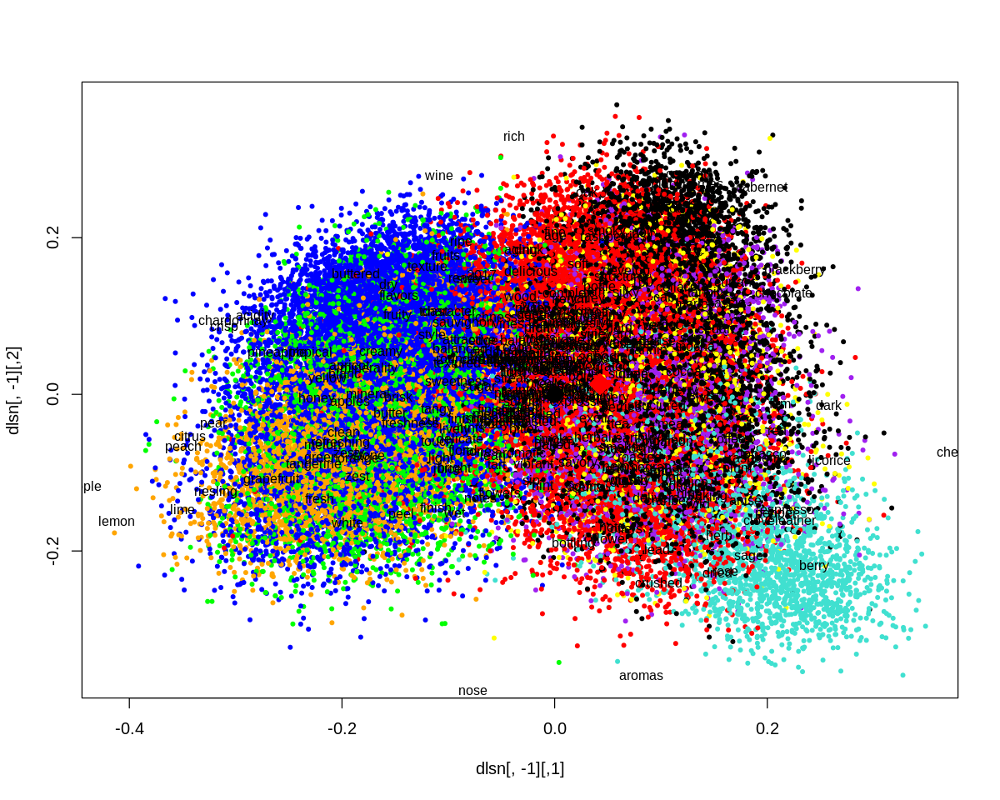

In [ ]:
plot( dlsn[,-1], pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto[,-1], labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(MerlotQuery$ls)[2],normrows(MerlotQuery$ls)[3],cex=3,pch=18,col="red")

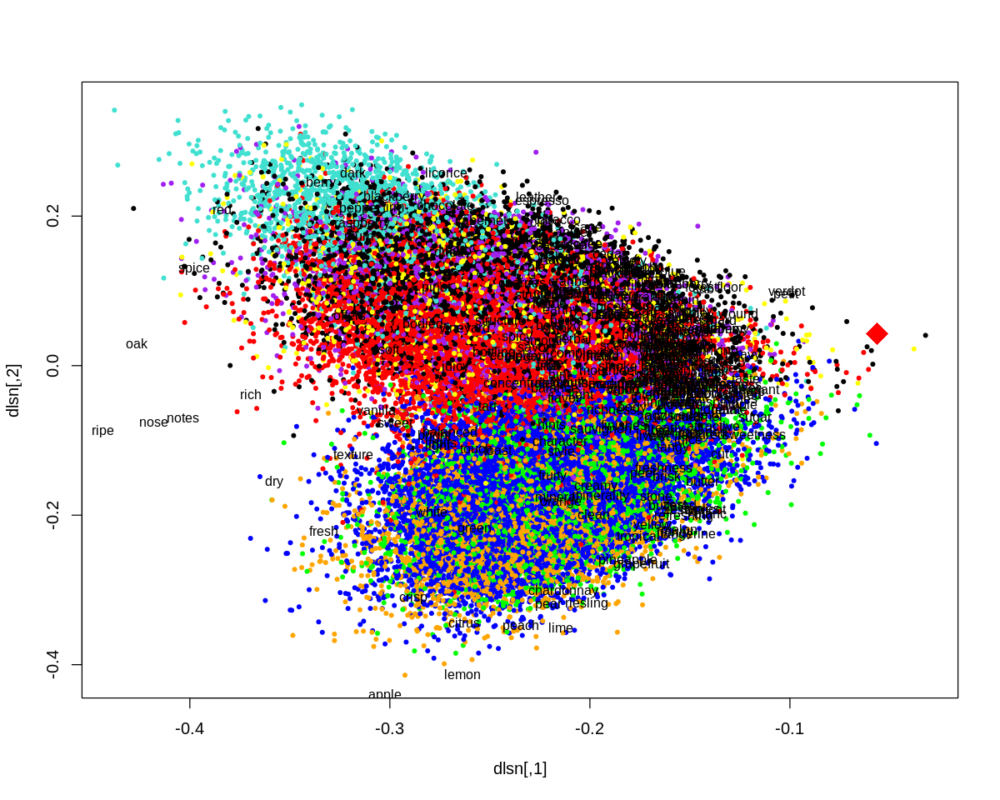

In [ ]:
plot( dlsn, pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto, labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(MerlotQuery$ls),cex=3,pch=18,col="red")

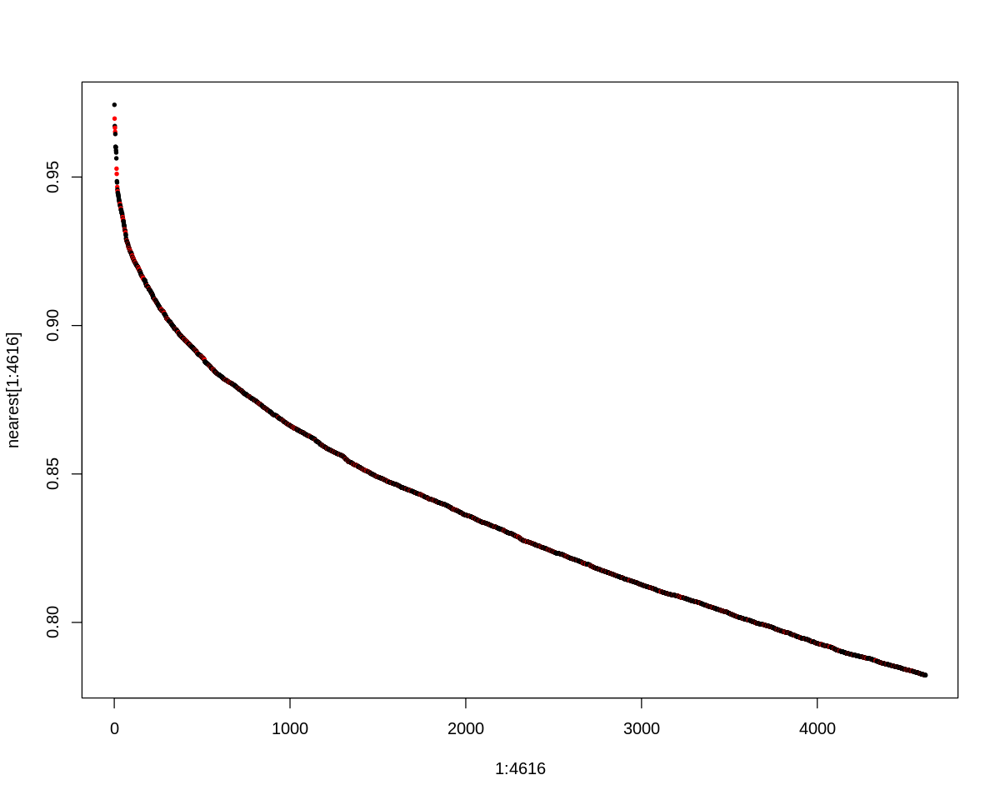

In [ ]:
nearest <- sort( cosines( dls[,1:7], MerlotQuery$ls[1:7] ), decreasing=T )

damcols2 <- rep( "black", length(variety) )
damcols2[ variety == "Merlot" ] <- "red" 

plot( 1:4616, nearest[1:4616], pch=20, cex=0.7, col=damcols2[strtoi(names(nearest))] )

In [ ]:
MerlotQuery.vs.Merlot <- table(1:nrow(dls) %in% top(cosines(dls[,1:7], MerlotQuery$ls[1:7]), 4616), variety=="Merlot" )
dimnames(MerlotQuery.vs.Merlot) <- list(MerlotQuery = c("No", "Si"), Merlot = c("No", "Si"))
MerlotQuery.vs.Merlot

c = chisq.test( MerlotQuery.vs.Merlot, correct=FALSE )
c$expected
c$p.value

           Merlot
MerlotQuery    No    Si
         No 44676  2149
         Si  3870   746

,No,Si
No,44189.78,2635.2204
Si,4356.22,259.7796


[1] 2.233621e-232